# Zona / Sub-Cortical Connectivity

## Table of Contents
* [Modules & Custom Functions](#imports)
* [Subject Demographics](#demographics)
* [Subcortical Analysis](#subcortical_analysis)
    * [Test Dataset](#test_analysis)
    * [Retest Dataset](#retest_analysis)
    * [Test vs Retest](#test_v_retest)
* [In-depth subcortical nodes](#subconn_detail)
* [Pallidothalamic tracts](#pallidothalamic)
* [Ansa Lenticularis (via ft)](#ansa_ft)
* [Installed Packages](#installed_pkgs)

## Modules & Custom Functions <a class="anchor" id="imports"></a>

Every time the notebook is started, the following code cell must be run.

In [8]:
import itertools
import os

import dill
import dipy.io.streamline
import matplotlib as mpl
import matplotlib.pyplot as plt
import nibabel as nib
import numpy as np
import pandas as pd
import pingouin as pg
import scipy.stats as stats
import seaborn as sns
from dipy.viz import colormap as cmap
from fury import actor, window
from IPython.display import HTML, clear_output
from joblib import Parallel, delayed
from joblib.pool import has_shareable_memory
from matplotlib.animation import FuncAnimation
from matplotlib.patches import Rectangle
from mne.viz import circular_layout, plot_connectivity_circle as plot_chord
from statsmodels.stats.multitest import fdrcorrection
from tqdm import tqdm

# Set number of processors for multiproccessing
n_proc = 12

# Define a function to handle importing database to avoid rerunning cells
def handle_session(save=False):
    if save:
        print("Saving notebook session")
        dill.dump_session(os.path.realpath("./db/hcpur100_3T_Zona_Connectivity.db"), byref=True)
    else:
        print("Loading notebook session")
        dill.load_session(os.path.realpath("./db/hcpur100_3T_Zona_Connectivity.db"))


# Pandas settings
pd.set_option("display.max_rows", None)

try:
    handle_session()
except:
    raise FileNotFoundError(
        """No database found - please run the all of the following cells to
    set up custom functions and perform analysis"""
    )

Loading notebook session


In [9]:
# Variables
test_dir = os.path.realpath("../../data/hcp1200_3T_2/hcp_test")
zona_dir = os.path.realpath("../../data/hcpur100_3T")

In [10]:
# Plot settings
# Color friendly color cycle - gist.github.com/thriveth/8560036
cb_color_cycle = [
    "#377eb8",
    "#ff7f00",
    "#4daf4a",
    "#f781bf",
    "#a65628",
    "#984ea3",
    "#999999",
    "#e41a1c",
    "#dede00",
]

cmap = mpl.cm.get_cmap("viridis")
cmap.set_bad("black")
sns.set(
    style="ticks",
    context="poster",
    rc={
        "image.cmap": "viridis",
        "axes.prop_cycle": plt.cycler(color=cb_color_cycle),
        "font.sans-serif": "Liberation Sans",
        "font.monospace": "Liberation Sans",
        "axes.titlesize": 16,
        "axes.titleweight": "bold",
        "axes.labelsize": 14,
        "axes.labelweight": "bold",
        "xtick.labelsize": 12,
        "ytick.labelsize": 12,
        "legend.fontsize": 12,
    },
)

boxprops = dict(edgecolor="white", alpha=0.5)
whiskerprops = dict(color="black", linestyle="--", alpha=0.5)
capprops = dict(color="black", alpha=0.5)
medianprops = dict(color="white", linewidth=2)
figure_dir = os.path.realpath("./figures")

/srv/khan/users/tkai/opt/venv/hcp-subcortical-analysis-_mFvww50-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("viridis"))
  app.launch_new_instance()


In [8]:
def make_mat(vals, mat_size):
    """
    Create a connectivity matrix from an array of sorted array of values

    INPUTS:
        vals - sorted array of values to be added to matrix
        mat_size - size of matrix
    """

    mask = ~np.tri(mat_size, k=0, dtype=bool)
    mat = np.zeros((mat_size, mat_size), dtype=np.float32)
    mat[mask] = vals
    mat.T[mask] = vals

    return mat

In [10]:
def check_hemi(node: int):
    return "Even" if ((node % 2) == 0) else "Odd"

In [12]:
def plot_subconn_density_scatter(
    df, node1, node2, fig=None, ax=None, lims=None, fname=None
):
    """
    Scatterplot of test vs retest tract density (log transformed). If
    intrahemispheric node, will automatically plot same nodes in
    opposite hemisphere

    INPUTS:
        df - dataframe containing information tract density info
        node1 - terminal node for tract
        node2 - other terminal node for tract
        fig - figure to draw on
        ax - axes to draw on
        lims - limits of xaxis; default: set to .05 below/above the min/max
        fname - file name to save figure (please include directory)
    """
    _intra = False

    # Grab data
    nodes = f"{node1}-{node2}"
    if np.unique(df[df["Nodes"] == nodes]["Hemi"])[0] == "L":
        nodes_opp = f"{node1 + 1}-{node2 + 1}"
        _intra = True
    elif np.unique(df[df["Nodes"] == nodes]["Hemi"])[0] == "R":
        nodes_opp = f"{node1 - 1}-{node2 - 1}"
        _intra = True

    if _intra:
        df = pd.concat(
            [df[df["Nodes"] == nodes], df[df["Nodes"] == nodes_opp]], sort=False
        )
    else:
        df = df[df["Nodes"] == nodes]

    pstats = stats.spearmanr(df["Test Density [log10]"], df["Retest Density [log10]"])

    # Plots
    if not fig:
        fig, ax = plt.subplots(1, 1, figsize=(5, 7))

    sns.scatterplot(
        data=df,
        x="Test Density [log10]",
        y="Retest Density [log10]",
        hue="Hemi",
        ax=ax,
        s=30,
        alpha=0.7,
    )

    sns.regplot(
        data=df,
        x="Test Density [log10]",
        y="Retest Density [log10]",
        ax=ax,
        scatter=False,
        color="black",
        ci=95,
        line_kws={"lw": 2, "linestyle": "--", "alpha": 0.5},
    )

    if not lims:
        lims = [
            round(
                np.min(
                    [
                        df["Test Density [log10]"].min(),
                        df["Retest Density [log10]"].min(),
                    ]
                ),
                2,
            ),
            round(
                np.max(
                    [
                        df["Test Density [log10]"].max(),
                        df["Retest Density [log10]"].max(),
                    ]
                ),
                2,
            ),
        ]
        lims = [lims[0] - 0.05, lims[1] + 0.05]

    # Plot params
    ax.set_xlim(lims)
    ax.set_xticks(np.arange(lims[0], lims[1], 0.2))
    ax.set_ylim(lims)
    ax.set_yticks(np.arange(lims[0], lims[1], 0.2))
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)

    connectivity = f'{parcellation_map[parcellation_map["Label"] == node1]["Nuclei"].values[0]} - {parcellation_map[parcellation_map["Label"] == node2]["Nuclei"].values[0]}'
    if _intra:
        connectivity = f'{parcellation_map[parcellation_map["Label"] == node1]["Nuclei"].values[0].split(None,1)[1]} - {parcellation_map[parcellation_map["Label"] == node2]["Nuclei"].values[0].split(None,1)[1]}'
        handles, legend = ax.get_legend_handles_labels()
        ax.legend(handles[:2], ["LH", "RH"], fontsize=12, markerscale=0.5)
    else:
        ax.get_legend().remove()

    ax.set_title(connectivity, fontsize=14, fontweight="bold")
    ax.text(
        lims[0] + 0.05,
        lims[1] - 0.2,
        s=f"$\\rho$ = {pstats[0]:.3f}, \n$p_{{{'uncorr'}}}$ = {pstats[1]:.3g}",
        size=12,
    )
    ax.set_xlabel("Avg. Test Tract Density [log(AFD/mm)]")
    ax.set_ylabel("Avg. Retest Tract Density [log(AFD/mm)]")

    if fname:
        plt.savefig(fname, dpi=300, bbox_inches="tight", facecolor="white")

    plt.show()
    plt.close()

In [13]:
def plot_subconn_density_box(
    df, node1, node2, fig=None, ax=None, lims=None, fname=None
):
    """
    Boxplots of test vs retest tract density. If
    intrahemispheric node, will automatically plot same nodes in
    opposite hemisphere

    INPUTS:
        df - dataframe containing information tract density info
        node1 - terminal node for tract
        node2 - other terminal node for tract
        fig - figure to draw on
        ax - axes to draw on
        lims - limits of xaxis; default: set to .05 below/above the min/max
        fname - file name to save figure (please include directory)
    """
    _intra = False

    # Grab data
    nodes = f"{node1}-{node2}"
    if np.unique(df[df["Nodes"] == nodes]["Hemi"])[0] == "L":
        nodes_opp = f"{node1 + 1}-{node2 + 1}"
        _intra = True
    elif np.unique(df[df["Nodes"] == nodes]["Hemi"])[0] == "R":
        nodes_opp = f"{node1 - 1}-{node2 - 1}"
        _intra = True

    if _intra:
        df = pd.concat(
            [df[df["Nodes"] == nodes], df[df["Nodes"] == nodes_opp]], sort=False
        )
    else:
        df = df[df["Nodes"] == nodes]

    if not fig:
        fig, ax = plt.subplots(1, 1, figsize=(5, 7))

    sns.boxplot(
        data=df,
        x="Hemi",
        y="Density [log]",
        hue="Dataset",
        dodge=True,
        ax=ax,
        boxprops=boxprops,
        whiskerprops=whiskerprops,
        capprops=capprops,
        medianprops=medianprops,
        showfliers=False,
        whis=0.95,
    )

    sns.swarmplot(
        data=df,
        x="Hemi",
        y=f"Density [log]",
        hue="Dataset",
        ax=ax,
        color="black",
        alpha=0.5,
        dodge=True,
        size=4,
    )

    if not lims:
        lims = [
            round(df["Density [log]"].min(), 2) - 0.05,
            round(df["Density [log]"].max(), 2) + 0.05,
        ]

    # Plot parameters
    ax.set_ylim(lims)
    ax.set_yticks(np.arange(lims[0], lims[1], 0.2))
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.set_ylabel("Tract Density [log(AFD/mm)]")

    connectivity = f'{parcellation_map[parcellation_map["Label"] == node1]["Nuclei"].values[0]} - {parcellation_map[parcellation_map["Label"] == node2]["Nuclei"].values[0]}'
    if _intra:
        connectivity = f'{parcellation_map[parcellation_map["Label"] == node1]["Nuclei"].values[0].split(None,1)[1]} - {parcellation_map[parcellation_map["Label"] == node2]["Nuclei"].values[0].split(None,1)[1]}'
        ax.set_xticklabels(["Left", "Right"])
        ax.set_xlabel("Hemisphere")
    else:
        ax.tick_params(bottom=False)
        ax.set_xticklabels([])
        ax.set_xlabel("")

    ax.set_title(connectivity, fontsize=14, fontweight="bold")
    handles, _ = ax.get_legend_handles_labels()
    ax.legend(handles[:2], ["Test", "Retest"], ncol=1)

    if fname:
        plt.savefig(fname, dpi=300, bbox_inches="tight", facecolor="white")

    plt.show()
    plt.close()

In [14]:
def plot_subconn_density_change(
    df, node1, node2, fig=None, ax=None, lims=None, fname=None
):
    """
    Boxplot of test vs retest tract density percent change. If
    intrahemispheric node, will automatically plot same nodes in
    opposite hemisphere

    INPUTS:
        df - dataframe containing information tract density info
        node1 - terminal node for tract
        node2 - other terminal node for tract
        fig - figure to draw on
        ax - axes to draw on
        lims - limits of xaxis; default: set to .05 below/above the min/max
        fname - file name to save figure (please include directory)
    """

    _intra = False

    # Grab data
    nodes = f"{node1}-{node2}"
    if np.unique(df[df["Nodes"] == nodes]["Hemi"])[0] == "L":
        nodes_opp = f"{node1 + 1}-{node2 + 1}"
        _intra = True
    elif np.unique(df[df["Nodes"] == nodes]["Hemi"])[0] == "R":
        nodes_opp = f"{node1 - 1}-{node2 - 1}"
        _intra = True

    if _intra:
        df = pd.concat(
            [df[df["Nodes"] == nodes], df[df["Nodes"] == nodes_opp]], sort=False
        )
    else:
        df = df[df["Nodes"] == nodes]

    if not fig:
        fig, ax = plt.subplots(1, 1, figsize=(5, 7))

    # Plot hemispheric difference
    sns.boxplot(
        data=df,
        x="Hemi",
        y=f"Percent Change",
        dodge=True,
        ax=ax,
        boxprops=boxprops,
        whiskerprops=whiskerprops,
        capprops=capprops,
        medianprops=medianprops,
        showfliers=False,
        whis=0.95,
    )

    sns.swarmplot(
        data=df,
        x="Hemi",
        y=f"Percent Change",
        ax=ax,
        color="black",
        alpha=0.5,
        dodge=True,
        size=4,
    )

    if not lims:
        lims = [
            round(df["Percent Change"].min(), -1),
            round(df["Percent Change"].max(), -1),
        ]

    # Plot parameters
    ax.set_ylim(lims)
    ax.set_yticks(np.arange(lims[0], lims[1], 25))
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.set_ylabel("Percent change [%]")

    connectivity = f'{parcellation_map[parcellation_map["Label"] == node1]["Nuclei"].values[0]} - {parcellation_map[parcellation_map["Label"] == node2]["Nuclei"].values[0]}'
    if _intra:
        connectivity = f'{parcellation_map[parcellation_map["Label"] == node1]["Nuclei"].values[0].split(None,1)[1]} - {parcellation_map[parcellation_map["Label"] == node2]["Nuclei"].values[0].split(None,1)[1]}'
        ax.set_xticklabels(["Left", "Right"])
        ax.set_xlabel("Hemisphere")
    else:
        ax.tick_params(bottom=False)
        ax.set_xticklabels([])
        ax.set_xlabel("")

    ax.set_title(connectivity, fontsize=14, fontweight="bold")

    if fname:
        plt.savefig(fname, dpi=300, bbox_inches="tight", facecolor="white")

    plt.show()
    plt.close()

In [15]:
def plot_subconn_overlap(df, node1, node2, fig=None, ax=None, lims=None, fname=None):
    """
    Boxplot of test vs retest tract overlap. If intrahemispheric node,
    will automatically plot same nodes in opposite hemisphere

    INPUTS:
        df - dataframe containing information tract density info
        node1 - terminal node for tract
        node2 - other terminal node for tract
        fig - figure to draw on
        ax - axes to draw on
        lims - limits of xaxis; default: set to .05 below/above the min/max
        fname - file name to save figure (please include directory)
    """

    _intra = False

    # Grab data
    nodes = f"{node1}-{node2}"
    if np.unique(df[df["Nodes"] == nodes]["Hemi"])[0] == "L":
        nodes_opp = f"{node1 + 1}-{node2 + 1}"
        _intra = True
    elif np.unique(df[df["Nodes"] == nodes]["Hemi"])[0] == "R":
        nodes_opp = f"{node1 - 1}-{node2 - 1}"
        _intra = True

    if _intra:
        df = pd.concat(
            [df[df["Nodes"] == nodes], df[df["Nodes"] == nodes_opp]], sort=False
        )
    else:
        df = df[df["Nodes"] == nodes]

    if not fig:
        fig, ax = plt.subplots(1, 1, figsize=(5, 7))

    # Plot hemispheric difference
    sns.boxplot(
        data=df,
        x="Hemi",
        y=f"Tract Overlap (wDSC)",
        dodge=True,
        ax=ax,
        boxprops=boxprops,
        whiskerprops=whiskerprops,
        capprops=capprops,
        medianprops=medianprops,
        showfliers=False,
        whis=0.95,
    )

    sns.swarmplot(
        data=df,
        x="Hemi",
        y=f"Tract Overlap (wDSC)",
        ax=ax,
        color="black",
        alpha=0.5,
        dodge=True,
        size=4,
    )

    if not lims:
        lims = [
            round(df["Tract Overlap (wDSC)"].min(), 1) - 0.025,
            round(df["Tract Overlap (wDSC)"].max(), 1) + 0.025,
        ]

    # Plot parameters
    ax.set_ylim(lims)
    ax.set_yticks(np.arange(lims[0] - 0.05, lims[1] + 0.05), 10)
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.set_ylabel("wDSC")

    connectivity = f'{parcellation_map[parcellation_map["Label"] == node1]["Nuclei"].values[0]} - {parcellation_map[parcellation_map["Label"] == node2]["Nuclei"].values[0]}'
    if _intra:
        connectivity = f'{parcellation_map[parcellation_map["Label"] == node1]["Nuclei"].values[0].split(None,1)[1]} - {parcellation_map[parcellation_map["Label"] == node2]["Nuclei"].values[0].split(None,1)[1]}'
        ax.set_xticklabels(["Left", "Right"])
        ax.set_xlabel("Hemisphere")
    else:
        ax.tick_params(bottom=False)
        ax.set_xticklabels([])
        ax.set_xlabel("")

    ax.set_title(connectivity, fontsize=14, fontweight="bold")

    if fname:
        plt.savefig(fname, dpi=300, bbox_inches="tight", facecolor="white")

    plt.show()
    plt.close()

In [16]:
def plot_subconn_relationship(
    df, node1, node2, fig=None, ax=None, ylims=None, xlims=None, fname=None
):
    """
    Regression plot showing relationship between wDSC and tract density [log].
    If intrahemispheric node, will automatically plot same nodes in opposite
    hemisphere

    INPUTS:
        df - dataframe containing information tract density info
        node1 - terminal node for tract
        node2 - other terminal node for tract
        fig - figure to draw on
        ax - axes to draw on
        lims - limits of xaxis; default: set to .05 below/above the min/max
        fname - file name to save figure (please include directory)
    """

    _intra = False

    # Grab data
    nodes = f"{node1}-{node2}"
    if np.unique(df[df["Nodes"] == nodes]["Hemi"])[0] == "L":
        nodes_opp = f"{node1 + 1}-{node2 + 1}"
        _intra = True
    elif np.unique(df[df["Nodes"] == nodes]["Hemi"])[0] == "R":
        nodes_opp = f"{node1 - 1}-{node2 - 1}"
        _intra = True

    if _intra:
        df = pd.concat(
            [df[df["Nodes"] == nodes], df[df["Nodes"] == nodes_opp]], sort=False
        )
    else:
        df = df[df["Nodes"] == nodes]

    pstats = stats.spearmanr(df["Avg Density [log10]"], df["Tract Overlap (wDSC)"])

    if not fig:
        fig, ax = plt.subplots(1, 1, figsize=(5, 7))

    # Plot regplot
    sns.scatterplot(
        data=df,
        x="Avg Density [log10]",
        y="Tract Overlap (wDSC)",
        hue="Hemi",
        ax=ax,
        s=30,
        alpha=0.7,
    )

    sns.regplot(
        data=df,
        x="Avg Density [log10]",
        y="Tract Overlap (wDSC)",
        ax=ax,
        scatter=False,
        color="black",
        ci=95,
        line_kws={"lw": 2, "linestyle": "--", "alpha": 0.5},
    )

    if not xlims:
        xlims = [
            round(df["Avg Density [log10]"].min(), 1) - 0.1,
            round(df["Avg Density [log10]"].max(), 1) + 0.1,
        ]

    if not ylims:
        ylims = [
            round(df["Tract Overlap (wDSC)"].min(), 1) - 0.025,
            round(df["Tract Overlap (wDSC)"].max(), 1) + 0.025,
        ]

    # Plot parameters
    ax.set_xlim(xlims)
    ax.set_xticks(np.arange(xlims[0], xlims[1], 0.2))
    ax.set_ylim(ylims)
    ax.set_yticks(np.arange(ylims[0] - 0.05, ylims[1] + 0.05), 10)
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.set_xlabel("Avg. Tract Density [log10]")
    ax.set_ylabel("wDSC")

    connectivity = f'{parcellation_map[parcellation_map["Label"] == node1]["Nuclei"].values[0]} - {parcellation_map[parcellation_map["Label"] == node2]["Nuclei"].values[0]}'
    if _intra:
        connectivity = f'{parcellation_map[parcellation_map["Label"] == node1]["Nuclei"].values[0].split(None,1)[1]} - {parcellation_map[parcellation_map["Label"] == node2]["Nuclei"].values[0].split(None,1)[1]}'
        handles, legend = ax.get_legend_handles_labels()
        ax.legend(handles[:2], ["LH", "RH"], fontsize=12, markerscale=0.5)
    else:
        ax.get_legend().remove()

    ax.set_title(connectivity, fontsize=14, fontweight="bold")
    ax.text(
        xlims[0] + 0.01,
        ylims[1] - 0.125,
        s=f"$\\rho$ = {pstats[0]:.3f}, \n$p_{{{'uncorr'}}}$ = {pstats[1]:.3g}",
        size=12,
    )

    if fname:
        plt.savefig(fname, dpi=300, bbox_inches="tight", facecolor="white")

    plt.show()
    plt.close()

In [17]:
def connectivity_summary(
    node1,
    node2,
    df_subconn=df_subconn,
    df_subconn_intersession=df_subconn_intersession,
    df_subconn_intrasession=df_subconn_intrasession,
):
    """
    Print summary for nodal connectivity. Prints a full summary
    for intrahemispheric nodes - for interhemispheric
    connectivity, only the intersession summary is printed.

    INPUTS:
        node1 - terminal node for tract
        node2 - other terminal node for tract
        df_subconn - dataframe with subject connectivity info
        df_subconn_intersession - dataframe with session comparisons
        df_subconn_intrasession - dataframe with hemispheric comparisons
    """

    nodes = f"{node1}-{node2}"
    avg_df_subconn = df_subconn[df_subconn["Nodes"] == nodes].mean()

    print(
        f"""Average values for {node1}-{node2}:
    Test Density \t\t{avg_df_subconn["Test Density"]}
    Retest Density \t\t{avg_df_subconn["Retest Density"]}
    Percent Change \t\t{avg_df_subconn["Percent Change"]}
    Tract Overlap \t\t{avg_df_subconn["Tract Overlap (wDSC)"]}\n"""
    )
    if check_hemi(node1) == check_hemi(node2):
        if check_hemi(node1) == "Odd":
            nodes = f"{node1+1}-{node2+1}"
        else:
            nodes = f"{node1-1}-{node2-1}"
        avg_df_subconn = df_subconn[df_subconn["Nodes"] == nodes].mean()
        print(
            f"""Average values for {nodes}:
    Test Density \t\t{avg_df_subconn["Test Density"]}
    Retest Density \t\t{avg_df_subconn["Retest Density"]}
    Percent Change \t\t{avg_df_subconn["Percent Change"]}
    Tract Overlap \t\t{avg_df_subconn["Tract Overlap (wDSC)"]}\n"""
        )

    print(
        f"""Intersession tract density (test vs retest): 
    t-stat \t\t\t{df_subconn_intersession[df_subconn_intersession["Nodes"] == nodes]["t-stat"].values[0]}
    Corrected p-val \t\t{df_subconn_intersession[df_subconn_intersession["Nodes"] == nodes]["t-pval (fdr)"].values[0]}\n"""
    )

    if check_hemi(node1) == check_hemi(node2):
        if check_hemi(node1) == "Odd":
            nodes = f"{node1}-{node2}"
        else:
            nodes = f"{node1-1}-{node2-1}"
        print(
            f"""Intrasession tract density (lh vs rh):
    Test t-stat \t\t{df_subconn_intrasession[df_subconn_intrasession["Nodes"] == nodes]["t-stat [Test]"].values[0]}
    Test corrected p-val \t{df_subconn_intrasession[df_subconn_intrasession["Nodes"] == nodes]["t-pval (fdr) [Test]"].values[0]}
    Retest t-stat \t\t{df_subconn_intrasession[df_subconn_intrasession["Nodes"] == nodes]["t-stat [Retest]"].values[0]}
    Retest corrected p-val \t{df_subconn_intrasession[df_subconn_intrasession["Nodes"] == nodes]["t-pval (fdr) [Retest]"].values[0]}"""
        )

NameError: name 'df_subconn' is not defined

In [18]:
# Scale 3D Plot
from mpl_toolkits.mplot3d.axes3d import Axes3D

def short_proj(ax, x_scale=1., y_scale=1., z_scale=1.):
    scale = np.diag([x_scale, y_scale, z_scale, 1.])
    scale = scale / scale.max()
    scale[3, 3] = 1.
    
    return np.dot(Axes3D.get_proj(ax), scale)

## Demographics <a class="anchor" id="demographics"></a>

In [11]:
# Subjects to remove because of problematic segmentations or
# tractography processing could not be completed due to time
del_subj = [101309, 144832]
del_subj = [f"sub-{subj}" for subj in del_subj]

# Check for repeat subjects and remove them
if not os.path.isfile(f"{zona_dir}/demographics.csv"):
    demographics_df = pd.read_csv(f"{zona_dir}/participants.tsv", delimiter="\t")
    test_df = pd.read_csv(f"/home/ROBARTS/tkai/graham/scratch/Zona/data/hcp1200_3T/participants.tsv", 
                          delimiter="\t", header=None)

    demographics_df = demographics_df[~demographics_df["participant_id"].isin(test_df[0].tolist())]
    
    # Save new list to disk
    demographics_df.to_csv(f"{zona_dir}/demographics.csv", index=None)
    del test_df

demographics_df = pd.read_csv(f"{zona_dir}/demographics.csv")
demographics_df = demographics_df[~demographics_df["participant_id"].isin(del_subj)]
demographics_df = demographics_df.rename(columns={"participant_id": "Subject"})

## Parcellation mapping

List is split into two cells to be able to show full list

In [12]:
parcellation_map = pd.read_csv(
    f"{test_dir}/derivatives/zona_bb_subcortex/code/subcortical-labels.csv"
)

# Grab indices to be evaluated (core network structures)
# Indices for thalamic labels
left_thal = [34, 36, 40, 42, 46, 50, 56, 68]
right_thal = [label+1 for label in left_thal]

# Indices for non-thalamic labels; ignore hippocampus
left_nonthal = [2, 4, 6, 8, 10, 12, 18]
right_nonthal = [label+1 for label in left_nonthal]

# Reindex list
reindex_list = list(
    np.concatenate([left_nonthal, left_thal, right_nonthal, right_thal])
)

# Drop hippocampal labels
parcellation_map = parcellation_map.filter(items=reindex_list, axis=0)
parcellation_map

,Label,Hemi,Nuclei,Abbrev
2,3,left,left substantia nigra,L SN
4,5,left,left subthalamic nucleus,L STN
6,7,left,left caudate,L Cau
8,9,left,left putamen,L Put
10,11,left,left globus pallidus externa,L GPe
12,13,left,left globus pallidus interna,L GPi
18,19,left,left amygdala,L Amy
34,35,left,left thalamus centromedian,L Thal CM
36,37,left,left thalamus ventral lateral anterior,L Thal VLa
40,41,left,left thalamus mediodorsal medial magnocellular,L Thal MDm


## Subcortical Analysis <a class="anchor" id="analysis"></a>

### HCPUR100 3T Dataset <a class="anchor" id="test_analysis"></a>

In [13]:
# Read in subject and node data
for subjIdx, subj in enumerate(tqdm(demographics_df["Subject"].tolist())):
    subj = f"{subj}"
    csv_file = f"{zona_dir}/derivatives/mrtpipelines_0.1.6/mrtpipelines/{subj}/tractography/{subj}_space-dwi_desc-subcortical_nodeweights.csv"

    if subjIdx is 0:
        hcpur_conn_mat = np.genfromtxt(csv_file, delimiter=" ")
        hcpur_conn_mat = hcpur_conn_mat[:, :, np.newaxis]
    else:
        temp_mat = np.genfromtxt(csv_file, delimiter=" ")
        temp_mat = temp_mat[:, :, np.newaxis]
        hcpur_conn_mat = np.append(hcpur_conn_mat, temp_mat, axis=2)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 77/77 [00:05<00:00, 13.65it/s]


#### Individual subjects

  0%|                                                                                                                                                                        | 0/77 [00:00<?, ?it/s]/srv/khan/users/tkai/opt/venv/hcp-subcortical-analysis-_mFvww50-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in log10
  # Remove the CWD from sys.path while we load stuff.
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 77/77 [00:29<00:00,  2.63it/s]


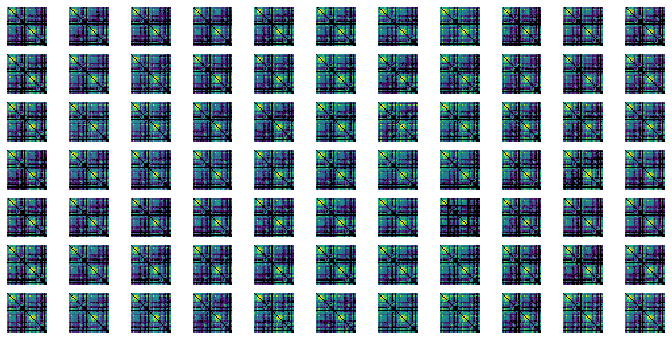

In [14]:
f, ax = plt.subplots(7, 11, figsize=(12, 6))

for s in tqdm(range(len(demographics_df["Subject"].tolist()))):
    df_test_subj = pd.DataFrame(hcpur_conn_mat[:, :, s])
    df_test_subj = df_test_subj.filter(items=reindex_list, axis=0).filter(items=reindex_list, axis=1)
    df_test_subj = df_test_subj.reindex(index=reindex_list, columns=reindex_list)

    # Plot
    sns.heatmap(
        np.log10(df_test_subj),
        ax=ax[int(s / 11)][s % 11],
        cmap="viridis",
        vmin=-1,
        vmax=4,
        square=True,
        cbar=None,
    )

    ax[int(s / 11)][s % 11].tick_params(axis="both", length=0)
    ax[int(s / 11)][s % 11].set_xticklabels("", va="top", ha="center")
    ax[int(s / 11)][s % 11].set_yticklabels("", rotation=0, va="top", ha="right")
    
for ax_i in range(5, 8):
    ax[4][ax_i].set_axis_off()

plt.show()
plt.close()

/srv/khan/users/tkai/opt/venv/hcp-subcortical-analysis-_mFvww50-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in log10
  # Remove the CWD from sys.path while we load stuff.


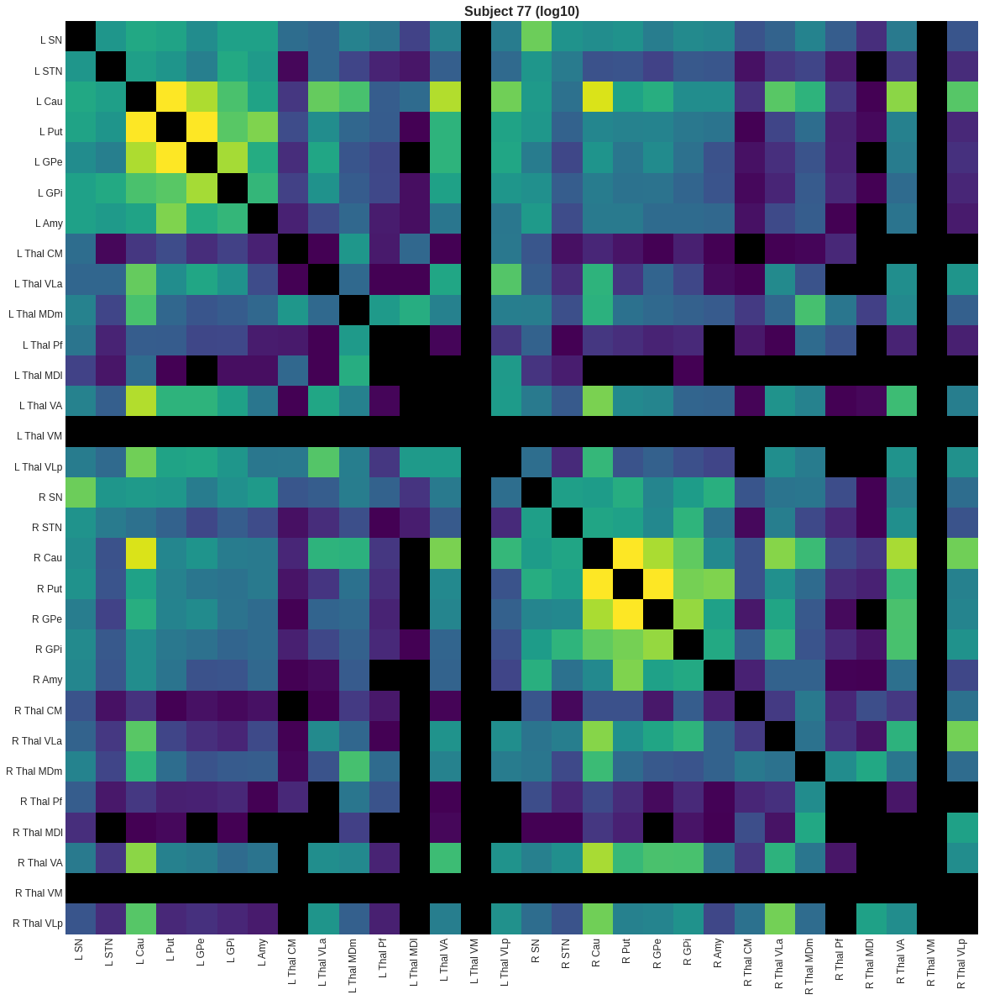

In [32]:
# Animation of individual subjects
def update(i):
    df_hcpur_subj = pd.DataFrame(hcpur_conn_mat[:, :, i])
    df_hcpur_subj = df_hcpur_subj.filter(items=reindex_list, axis=0).filter(items=reindex_list, axis=1)

    # Reorganize dataframe by hemisphere
    df_hcpur_subj = df_hcpur_subj.reindex(index=reindex_list, columns=reindex_list)

    graph = sns.heatmap(
        np.log10(df_hcpur_subj),
        ax=ax,
        cmap="viridis",
        vmin=-1,
        vmax=4,
        square=True,
        cbar=False,
    )

    ax.set_title("Subject {0} (log10)".format(i + 1))
    ax.set_xticklabels(
        parcellation_map.reindex(index=reindex_list)["Abbrev"],
        rotation=90,
        va="top",
        ha="center",
    )
    ax.set_yticklabels(
        parcellation_map.reindex(index=reindex_list)["Abbrev"],
        rotation=0,
        va="top",
        ha="right",
    )

    return (graph,)


fig, ax = plt.subplots(1, 1, figsize=(20, 20))
ax.tick_params(axis="both", length=0)
ax.set_xticks(np.arange(len(parcellation_map.reindex(index=reindex_list)["Abbrev"])))
ax.set_xticklabels(
    parcellation_map.reindex(index=reindex_list)["Abbrev"],
    rotation=90,
    va="top",
    ha="center",
)
ax.set_yticks(np.arange(len(parcellation_map.reindex(index=reindex_list)["Abbrev"])))
ax.set_yticklabels(
    parcellation_map.reindex(index=reindex_list)["Abbrev"],
    rotation=0,
    va="top",
    ha="right",
)

ani = FuncAnimation(
    fig, update, frames=hcpur_conn_mat.shape[2], interval=200, repeat=True
)

filename = f"{figure_dir}/test_subj_streamline_weight.gif"
# ani.save(filename, writer="imagemagick", fps=1)

HTML(ani.to_html5_video())

In [34]:
plt.close()

#### Group stats

In [15]:
hcpur_conn_avgmat = np.nanmean(hcpur_conn_mat, axis=2)
hcpur_conn_stdmat = np.nanstd(hcpur_conn_mat, axis=2)
hcpur_conn_covmat = hcpur_conn_stdmat / hcpur_conn_avgmat

df_hcpur_avg_subconn = pd.DataFrame(hcpur_conn_avgmat)
df_hcpur_avg_subconn = df_hcpur_avg_subconn.filter(items=reindex_list, axis=0).filter(items=reindex_list, axis=1)

df_hcpur_std_subconn = pd.DataFrame(hcpur_conn_stdmat)
df_hcpur_std_subconn = df_hcpur_std_subconn.filter(items=reindex_list, axis=0).filter(items=reindex_list, axis=1)

df_hcpur_cov_subconn = pd.DataFrame(hcpur_conn_covmat)
df_hcpur_cov_subconn = df_hcpur_cov_subconn.filter(items=reindex_list, axis=0).filter(items=reindex_list, axis=1)

# Add hemisphere and nuclei information
df_hcpur_avg_subconn["nuclei"] = df_hcpur_std_subconn["nuclei"] = df_hcpur_cov_subconn[
    "nuclei"
] = parcellation_map["Abbrev"]

# Reorganize dataframe by hemisphere
df_hcpur_avg_subconn = df_hcpur_avg_subconn.reindex(
    index=reindex_list, columns=reindex_list
)
df_hcpur_std_subconn = df_hcpur_std_subconn.reindex(
    index=reindex_list, columns=reindex_list
)
df_hcpur_cov_subconn = df_hcpur_cov_subconn.reindex(
    index=reindex_list, columns=reindex_list
)

/srv/khan/users/tkai/opt/venv/hcp-subcortical-analysis-_mFvww50-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


/srv/khan/users/tkai/opt/venv/hcp-subcortical-analysis-_mFvww50-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log10
  if __name__ == '__main__':
/srv/khan/users/tkai/opt/venv/hcp-subcortical-analysis-_mFvww50-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in log10


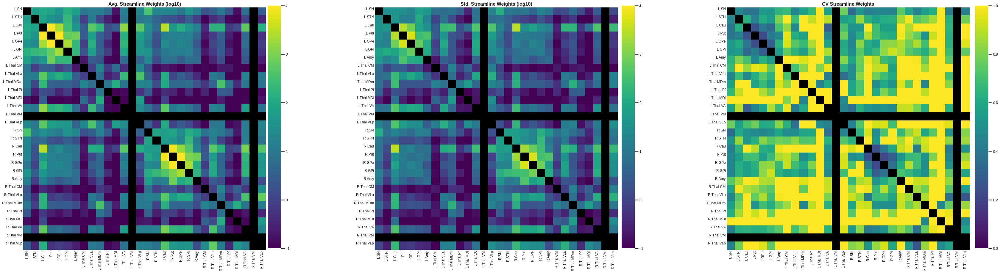

In [16]:
# Plot group stats
%matplotlib inline

f, ax = plt.subplots(1, 3, figsize=(60, 15))

# Average
cbar_ax1 = f.add_axes([0.335, 0.13, 0.01, 0.755])
sns.heatmap(
    np.log10(df_hcpur_avg_subconn),
    ax=ax[0],
    cmap="viridis",
    vmin=-1,
    vmax=4,
    square=True,
    cbar_ax=cbar_ax1,
)
ax[0].set_title("Avg. Streamline Weights (log10)")

# Standard Deviation
cbar_ax2 = f.add_axes([0.610, 0.13, 0.01, 0.755])
sns.heatmap(
    np.log10(df_hcpur_std_subconn),
    ax=ax[1],
    cmap="viridis",
    vmin=-1,
    vmax=4,
    square=True,
    cbar_ax=cbar_ax2,
)
ax[1].set_title("Std. Streamline Weights (log10)")

# COV
cbar_ax3 = f.add_axes([0.885, 0.13, 0.01, 0.755])
sns.heatmap(
    df_hcpur_cov_subconn,
    ax=ax[2],
    cmap="viridis",
    vmin=0,
    vmax=1,
    square=True,
    cbar_ax=cbar_ax3,
)
ax[2].set_title("CV Streamline Weights")

# Labels
for d in range(3):
    ax[d].tick_params(axis="both", length=0)
    ax[d].set_xticklabels(
        parcellation_map.reindex(index=reindex_list)["Abbrev"], va="top", ha="center",
        rotation=90
    )
    ax[d].set_yticks(
        np.arange(len(parcellation_map.reindex(index=reindex_list)["Abbrev"]))
    )
    ax[d].set_yticklabels(
        parcellation_map.reindex(index=reindex_list)["Abbrev"],
        rotation=0,
        va="top",
        ha="right",
    )

filename = "{0}/hcpur_avg_streamline_weights.svg".format(figure_dir)
# plt.savefig(filename, dpi=300, bbox_inches="tight", facecolor="white")

plt.show()
plt.close()

In [17]:
# CV for all connections
hcpur_avg = df_hcpur_avg_subconn
hcpur_avg = hcpur_avg.replace(0, np.nan)
hcpur_avg = hcpur_avg.where(np.triu(np.ones(hcpur_avg.shape), k=1).astype(np.bool))
hcpur_avg = hcpur_avg.values.flatten()
hcpur_avg = hcpur_avg[np.logical_not(np.isnan(hcpur_avg))]

hcpur_cv = df_hcpur_cov_subconn
hcpur_cv = hcpur_cv.where(np.triu(np.ones(hcpur_cv.shape), k=1).astype(np.bool))
hcpur_cv = hcpur_cv.values.flatten()
hcpur_cv = hcpur_cv[np.logical_not(np.isnan(hcpur_cv))]

df_hcpur_cv_vs_avg = pd.DataFrame(
    {"CV": hcpur_cv, "Avg": hcpur_avg, "Avg (log)": np.log10(hcpur_avg)}
)
df_hcpur_cv_vs_avg.sort_values(by=["CV"], inplace=True, ascending=False)

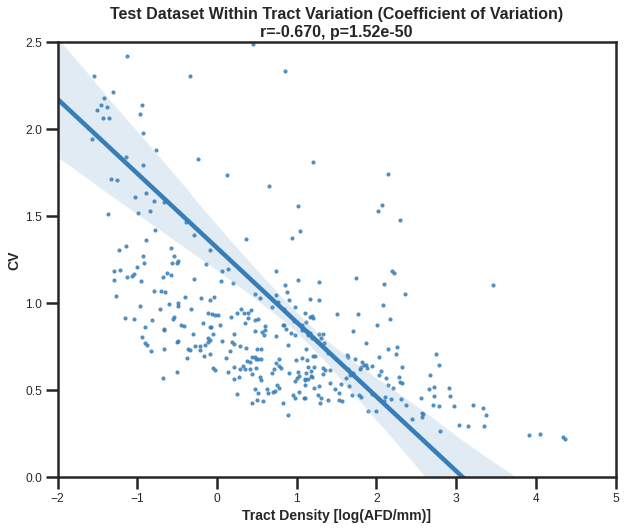

In [18]:
# Plot all CV
%matplotlib inline

fig, ax = plt.subplots(1, 1, figsize=(10, 8))
sns.regplot(
    x="Avg (log)",
    y="CV",
    data=df_hcpur_cv_vs_avg,
    ax=ax,
    ci=95,
    scatter_kws={"s": 10},
)

pstats = stats.spearmanr(df_hcpur_cv_vs_avg["Avg (log)"], df_hcpur_cv_vs_avg["CV"])


ax.set_title(
    f"""Test Dataset Within Tract Variation (Coefficient of Variation)
r={pstats[0]:.3f}, p={pstats[1]:.3g}"""
)
ax.set_xlabel("Tract Density [log(AFD/mm)]")
ax.set_ylim([0, 2.5])
ax.set_xlim([-2, 5])

filename = "{0}/test_all_cv.svg".format(figure_dir)
# plt.savefig(filename, dpi=300, bbox_inches="tight", facecolor="white")

plt.show()
plt.close()

In [19]:
plt.close()

#### Averaged stats

In [ ]:
# Create data frame
df_hcpur = pd.DataFrame(np.nanmean(hcpur_conn_mat, axis=2))
df_hcpur = df_hcpur.filter(items=reindex_list, axis=0).filter(items=reindex_list, axis=1)
df_hcpur = df_hcpur.replace(0, np.nan)

# Add labels
df_hcpur["hemi"] = parcellation_map["Hemi"]
df_hcpur["nuclei"] = parcellation_map["Nuclei"]

# Reorganize by hemi
df_hcpur.sort_values(by=["nuclei"], inplace=True)
temp_list = df_hcpur.index.tolist()
temp_list.append("hemi")
temp_list.append("nuclei")
df_hcpur.sort_values(by=["nuclei"], inplace=True)
df_hcpur = df_hcpur.reindex(columns=temp_list)

# Get hemispheric connections
hcpur_vals = []

hcpur_left = df_hcpur.iloc[0:7, 0:7].to_numpy()[np.triu_indices(7, k=1)]
hcpur_left = np.append(hcpur_left, df_hcpur.iloc[0:7, 7:15].to_numpy().flatten())
hemi = ["Left" for i in range(len(hcpur_left))]
hcpur_vals = np.append(hcpur_vals, hcpur_left)

hcpur_right = df_hcpur.iloc[15:22, 15:22].to_numpy()[np.triu_indices(7, k=1)]
hcpur_right = np.append(hcpur_right, df_hcpur.iloc[15:22, 22:30].to_numpy().flatten())

hemi = np.append(hemi, ["Right" for i in range(len(hcpur_right))])
hcpur_vals = np.append(hcpur_vals, hcpur_right)

# Create dataframe to store data for plotting
df_hcp_core = pd.DataFrame(
    {
        "HCPUR": np.log10(hcpur_vals),
        "Density": np.log10(np.nanmean(np.array([hcpur_vals]), axis=0)),
        "Hemi": hemi,
    }
)

del (
    df_hcpur,
    temp_list,
    hemi,
    hcpur_left,
    hcpur_vals,
    hcpur_right,
)

/srv/khan/users/tkai/opt/venv/hcp-subcortical-analysis-_mFvww50-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: Mean of empty slice


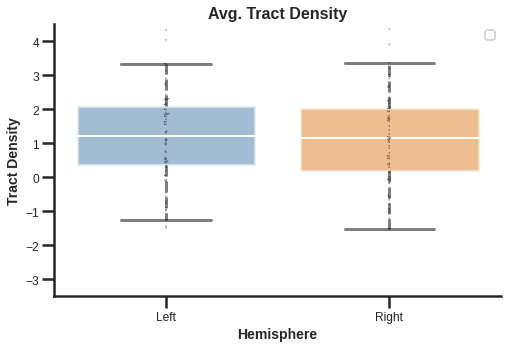

In [27]:
# Plot hemispheric differences
%matplotlib inline

fig, ax = plt.subplots(1, 1, figsize=(8, 5))

sns.boxplot(
    data=df_hcp_core,
    x="Hemi",
    y="Density",
    dodge=True,
    boxprops=boxprops,
    whiskerprops=whiskerprops,
    capprops=capprops,
    medianprops=medianprops,
    showfliers=False,
    whis=0.95,
)
sns.swarmplot(
    data=df_hcp_core,
    x="Hemi",
    y="Density",
    color="black",
    alpha=0.5,
    dodge=True,
    size=1.5,
)

ax.set_ylim([-3.5, 4.5])
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:2], labels[:2])
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)

plt.title("Avg. Tract Density")
plt.ylabel("Tract Density")
plt.xlabel("Hemisphere")

# filename = f"{figure_dir}/percent_diff_by_hemi.png"
# plt.savefig(filename, dpi=300, bbox_inches="tight", facecolor="white")

plt.show()
plt.close()

# del df

#### ROI metrics

In [28]:
subjlist = pd.read_csv(f"{zona_dir}/participants.tsv", header=None)

df_rois = dict()
df_rois["Subject"] = []
df_rois["Label"] = []
df_rois["Size (mm^3)"] = []

for subj in tqdm(demographics_df["Subject"].values):
    subj = f"{subj}"

    # Load segmentations
    # Voxel size -
    subj_rois = nib.load(
        f"{zona_dir}/derivatives/zona_bb_subcortex/{subj}/anat/{subj}_space-T1w_desc-ZonaBBSubCorSeg.nii.gz"
    )
    vox_size = subj_rois.header.get_zooms()
    subj_rois = subj_rois.get_fdata()

    for label in parcellation_map["Label"].tolist():
        roi = subj_rois == label
        roi_size = np.round(roi.sum() * vox_size[0] * vox_size[1] * vox_size[2], 3)

        df_rois["Subject"].append(subj)
        df_rois["Label"].append(label)
        df_rois["Size (mm^3)"].append(roi_size)

df_rois = pd.DataFrame(df_rois)
del roi, subj_rois, vox_size

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 77/77 [02:07<00:00,  1.66s/it]


In [40]:
df_subconn["Node 1 Size"] = np.nan
df_subconn["Node 2 Size"] = np.nan

for idx, row in tqdm(df_subconn.iterrows()):
    df_subconn.at[idx, "Node 1 Size"] = df_rois[
        (df_rois["Subject"] == f'{df_subconn.loc[idx, "Subject"]}')
        & (df_rois["Label"] == int(df_subconn.loc[idx, "Nodes"].split("-")[0]))
    ]["Size (mm^3)"].values
    df_subconn.at[idx, "Node 2 Size"] = df_rois[
        (df_rois["Subject"] == f'{df_subconn.loc[idx, "Subject"]}')
        & (df_rois["Label"] == int(df_subconn.loc[idx, "Nodes"].split("-")[1]))
    ]["Size (mm^3)"].values[0]

df_subconn["Node 1 Size [log]"] = np.log10(df_subconn["Node 1 Size"])
df_subconn["Node 2 Size [log]"] = np.log10(df_subconn["Node 2 Size"])

handle_session(save=True)

33495it [00:59, 558.40it/s]
/srv/khan/users/tkai/opt/venv/hcp-subcortical-analysis-_mFvww50-py3.7/lib/python3.7/site-packages/pandas/core/series.py:679: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


Saving notebook session


In [55]:
from statsmodels.formula.api import ols

df = df_subconn.copy()
df = df[df["HCPUR Density"] != 0]
df = df.rename(columns={"HCPUR Density [log10]":"HCPDensity", "Node 1 Size [log]":"Node1Size", "Node 2 Size [log]":"Node2Size"})

results = ols("HCPDensity ~ Node1Size + Node2Size", data=df.dropna()).fit()
ols_params = results.params

results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             HCPDensity   R-squared:                       0.235
Model:                            OLS   Adj. R-squared:                  0.235
Method:                 Least Squares   F-statistic:                     3959.
Date:                Fri, 12 Nov 2021   Prob (F-statistic):               0.00
Time:                        10:17:03   Log-Likelihood:                -37627.
No. Observations:               25736   AIC:                         7.526e+04
Df Residuals:                   25733   BIC:                         7.528e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -3.7362      0.050    -74.000      0.000      -3.835      -3.637
Node1Size      0.7445      0.012     60.574      0.000       0.720       0.769
Node2Size      0.8741      0.013     67.007      0.000       0.849       0.900
==============================================================================
Omnibus:                      362.244   Durbin-Watson:                   0.246
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              252.712
Skew:                           0.130   Prob(JB):                     1.33e-55
Kurtosis:                       2.590   Cond. No.                         32.4
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

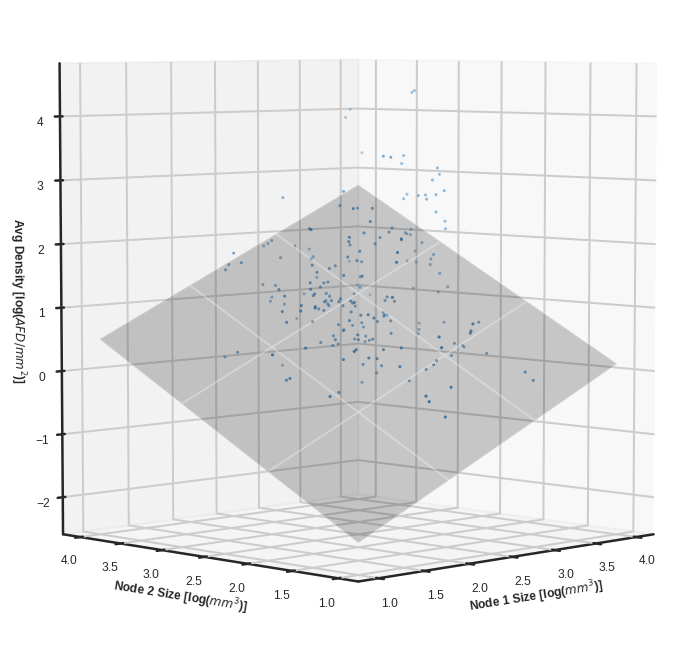

In [58]:
%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D

fontsize=12

fig = plt.figure(figsize=(12, 12))
ax1 = fig.add_subplot(1, 1, 1, projection="3d")

xx, yy = np.meshgrid(range(1, 5), range(1, 5))
zz = ols_params[0] + xx * ols_params[1] + yy * ols_params[2]

# Get values
x = df_subconn.groupby("Nodes").mean()["Node 1 Size [log]"]
y = df_subconn.groupby("Nodes").mean()["Node 2 Size [log]"]
z = df_subconn.groupby("Nodes").mean()["HCPUR Density [log10]"]
# Plot
ax1.view_init(5, 225)
ax1.scatter(x, y, z, c=cb_color_cycle[0], s=1)
ax1.plot_surface(xx, yy, zz, alpha=0.2, edgecolor=None, color="black")
ax1.get_proj = lambda: np.dot(Axes3D.get_proj(ax1), np.diag([1., 1., 1.5, 1.]))
# Labels
ax1.set_xlabel("Node 1 Size [log($mm^3$)]", fontsize=fontsize)
ax1.set_ylabel("Node 2 Size [log($mm^3$)]", fontsize=fontsize)
ax1.set_zlabel("Avg Density [log($AFD/mm^2$)]", fontsize=fontsize)
ax1.text(0, 0, 6, f"$r^2$ = {results.rsquared_adj:.3f}", fontsize=fontsize)

plt.show()
# plt.close()

In [59]:
plt.close()

### UR100 vs Test-Retest <a class="anchor" id="test_v_retest"></a>

In [ ]:
diff_conn_avgmat = np.nanmean(diff_conn_mat, axis=2)
diff_conn_stdmat = np.nanstd(diff_conn_mat, axis=2)

df_avg_subconn = pd.DataFrame(diff_conn_avgmat)
df_avg_subconn = df_avg_subconn.drop(index=[14, 15], columns=[14, 15])
# df_avg_subconn.loc[left_thal, left_thal] = df_avg_subconn.loc[
#     right_thal, right_thal
# ] = np.nan
df_std_subconn = pd.DataFrame(diff_conn_stdmat)
df_std_subconn = df_std_subconn.drop(index=[14, 15], columns=[14, 15])
# df_std_subconn.loc[left_thal, left_thal] = df_std_subconn.loc[
#     right_thal, right_thal
# ] = np.nan

# Reorganize dataframe by hemisphere
df_avg_subconn = df_avg_subconn.reindex(index=reindex_list, columns=reindex_list)
df_std_subconn = df_std_subconn.reindex(index=reindex_list, columns=reindex_list)

/home/ROBARTS/tkai/khan/users/tkai/opt/venv/.jupytervenv/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: Mean of empty slice
  """Entry point for launching an IPython kernel.
/home/ROBARTS/tkai/khan/users/tkai/opt/venv/.jupytervenv/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


In [ ]:
# Statistical testing for differences between test vs retest
pval_mat = np.copy(diff_conn_mat[:, :, 0])

uncor_pval = np.array([])
for (i, j) in itertools.combinations(range(diff_conn_mat.shape[0]), 2):
    test_values = test_conn_mat[i, j, :]
    retest_values = retest_conn_mat[i, j, :]

    tstat, pval = stats.ttest_rel(test_values, retest_values, nan_policy="omit")
    uncor_pval = np.append(uncor_pval, pval)

nan_idx = np.argwhere(np.isnan(uncor_pval))
uncor_pval = np.delete(uncor_pval, nan_idx)
_, cor_pval = fdrcorrection(uncor_pval)
for idx in nan_idx:
    cor_pval = np.insert(cor_pval, idx, np.nan)

k = 0
for (i, j) in itertools.combinations(range(test_conn_mat.shape[0]), 2):
    pval_mat[i][i] = np.nan

    pval_mat[i][j] = cor_pval[k]
    pval_mat[j][i] = cor_pval[k]
    k += 1

df_pval_mat = pd.DataFrame(pval_mat)
df_pval_mat = df_pval_mat.drop(index=[14, 15], columns=[14, 15])
# df_pval_mat.loc[left_thal, left_thal] = df_pval_mat.loc[right_thal, right_thal] = np.nan
# Reorganize dataframe by hemisphere
df_pval_mat = df_pval_mat.reindex(index=reindex_list, columns=reindex_list)

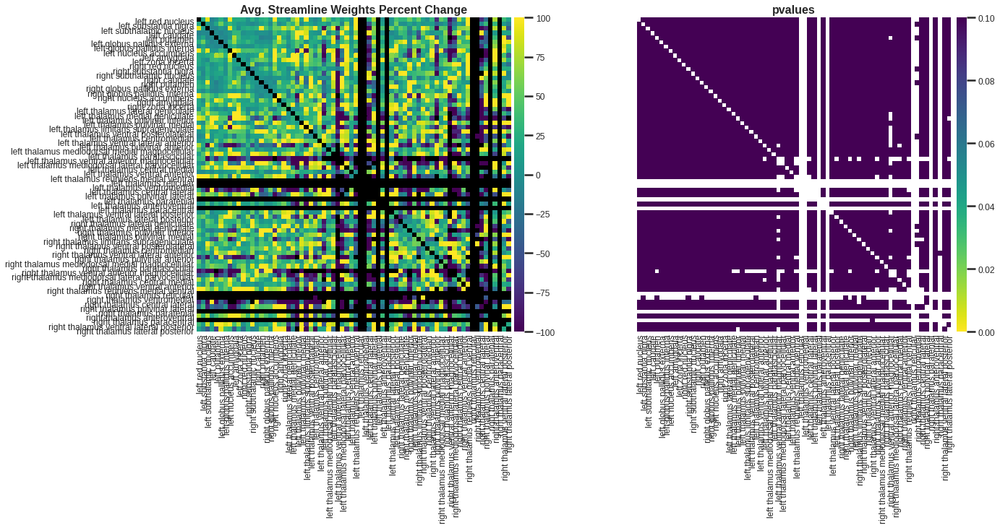

In [ ]:
# Plot significant differences
%matplotlib inline

f, ax = plt.subplots(1, 2, figsize=(20, 8))

# Average
cbar_ax1 = f.add_axes([0.455, 0.125, 0.01, 0.755])
sns.heatmap(
    df_avg_subconn,
    ax=ax[0],
    cmap="viridis",
    vmin=-100,
    vmax=100,
    square=True,
    cbar_ax=cbar_ax1,
)
ax[0].set_title("Avg. Streamline Weights Percent Change")

# P-Values
cbar_ax2 = f.add_axes([0.880, 0.125, 0.01, 0.755])
sns.heatmap(
    df_pval_mat,
    ax=ax[1],
    cmap="viridis_r",
    vmin=0.0,
    vmax=0.1,
    square=True,
    cbar_ax=cbar_ax2,
)
ax[1].set_title("pvalues")

for d in range(2):
    ax[d].tick_params(axis="both", length=0)
    ax[d].set_xticks(
        np.arange(len(parcellation_map.reindex(index=reindex_list)["Nuclei"]))
    )
    ax[d].set_xticklabels(
        parcellation_map.reindex(index=reindex_list)["Nuclei"], va="top", ha="left"
    )
    if d == 0:
        ax[d].set_yticks(
            np.arange(len(parcellation_map.reindex(index=reindex_list)["Nuclei"]))
        )
        ax[d].set_yticklabels(
            parcellation_map.reindex(index=reindex_list)["Nuclei"],
            rotation=0,
            va="top",
            ha="right",
        )
    else:
        ax[d].set_yticklabels("")

plt.show()
plt.close()

#### Percent change

In [ ]:
# Left
df_avg_subconn["Nuclei"] = parcellation_map.reindex(index=reindex_list)["Nuclei"]
df_avg_subconn = df_avg_subconn.sort_values(by=["Nuclei"])
df_avg_subconn = df_avg_subconn.reindex(columns=df_avg_subconn.index.tolist())

diff_value = df_avg_subconn.iloc[0:35, 0:35].to_numpy()[np.triu_indices(35, k=1)]
hemi = ["Left" for i in range(len(diff_value))]

# Right
diff_R = df_avg_subconn.iloc[35:70, 35:70].to_numpy()[np.triu_indices(35, k=1)]
diff_value = np.append(diff_value, diff_R)
hemi = np.append(hemi, ["Right" for i in range(len(diff_R))])

# Inter
diff_int = df_avg_subconn.iloc[0:35, 35:70]
diff_int = diff_int.values.flatten()
diff_value = np.append(diff_value, diff_int)
hemi = np.append(hemi, ["Inter" for i in range(len(diff_int))])

# Dataframe
df_diff = pd.DataFrame({"Value": diff_value, "Hemi": hemi})

del diff_int, diff_value, hemi

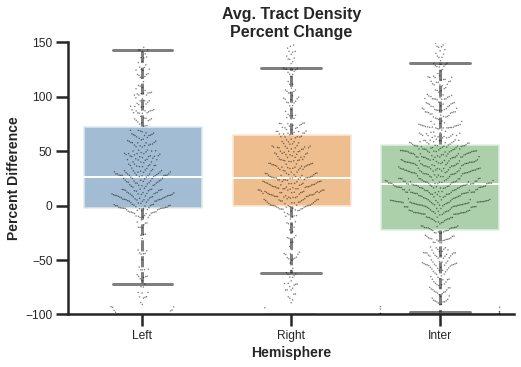

In [ ]:
# Plot hemispheric differences
%matplotlib inline

fig, ax = plt.subplots(1, 1, figsize=(8, 5))

sns.boxplot(
    data=df_diff,
    x="Hemi",
    y="Value",
    hue="Hemi",
    dodge=False,
    boxprops=boxprops,
    whiskerprops=whiskerprops,
    capprops=capprops,
    medianprops=medianprops,
    showfliers=False,
    whis=0.95,
)
sns.swarmplot(
    data=df_diff, x="Hemi", y="Value", color="black", alpha=0.5, dodge=False, size=1.5
)

ax.set_ylim([-100, 150])
ax.get_legend().remove()
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)

plt.title("Avg. Tract Density\nPercent Change")
plt.ylabel("Percent Difference")
plt.xlabel("Hemisphere")

# filename = f"{figure_dir}/percent_diff_by_hemi.png"
# plt.savefig(filename, dpi=300, bbox_inches="tight", facecolor="white")

plt.show()
plt.close()

#### Intraclass Correlation

Here, we are looking at how reproducible the streamline weights are across sessions for each subject

In [81]:
# Set up ICC dataframe
groups = np.ones(test_conn_mat.shape[2])
groups = np.concatenate((groups, np.ones(test_conn_mat.shape[2]) + 1))
ids = np.arange(test_conn_mat.shape[2])
ids = np.concatenate((ids, ids))

icc = np.zeros((test_conn_mat.shape[0], test_conn_mat.shape[1]))

for (i, j) in tqdm(itertools.combinations(range(test_conn_mat.shape[0]), 2)):
    icc[i][i] = np.nan

    values_test = test_conn_mat[i, j, :]
    values_retest = retest_conn_mat[i, j, :]

    values = np.concatenate((values_test, values_retest))

    icc_df = pd.DataFrame({"sample": groups, "id": ids, "value": np.log10(values)})

    icc_res = pg.intraclass_corr(
        data=icc_df, targets="id", raters="sample", ratings="value"
    ).round(3)
    icc_type = "ICC2"
    icc[i][j] = icc_res[icc_res["Type"] == icc_type]["ICC"].values[0]
    icc[j][i] = icc[i][j]

# Create dataframe
df_icc_mat = pd.DataFrame(icc)
df_icc_mat = df_icc_mat.drop(index=[14, 15], columns=[14, 15])
# df_icc_mat.loc[left_thal, left_thal] = df_icc_mat.loc[right_thal, right_thal] = np.nan
# Reorganize dataframe by hemisphere
df_icc_mat = df_icc_mat.reindex(index=reindex_list, columns=reindex_list)

del groups, ids, icc, values_test, values_retest, values, icc_res, icc_type

25it [00:02, 12.64it/s]/home/ROBARTS/tkai/khan/users/tkai/opt/venv/.jupytervenv/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: divide by zero encountered in log10
53it [00:04, 12.57it/s]/home/ROBARTS/tkai/khan/users/tkai/opt/venv/.jupytervenv/lib/python3.7/site-packages/pingouin/reliability.py:308: RuntimeWarning: invalid value encountered in double_scalars
  icc1 = (msb - msw) / (msb + (k - 1) * msw)
/home/ROBARTS/tkai/khan/users/tkai/opt/venv/.jupytervenv/lib/python3.7/site-packages/pingouin/reliability.py:309: RuntimeWarning: invalid value encountered in double_scalars
  icc2 = (msb - mse) / (msb + (k - 1) * mse + k * (msj - mse) / n)
/home/ROBARTS/tkai/khan/users/tkai/opt/venv/.jupytervenv/lib/python3.7/site-packages/pingouin/reliability.py:310: RuntimeWarning: invalid value encountered in double_scalars
  icc3 = (msb - mse) / (msb + (k - 1) * mse)
/home/ROBARTS/tkai/khan/users/tkai/opt/venv/.jupytervenv/lib/python3.7/site-packages/pingouin/reliability.py:311

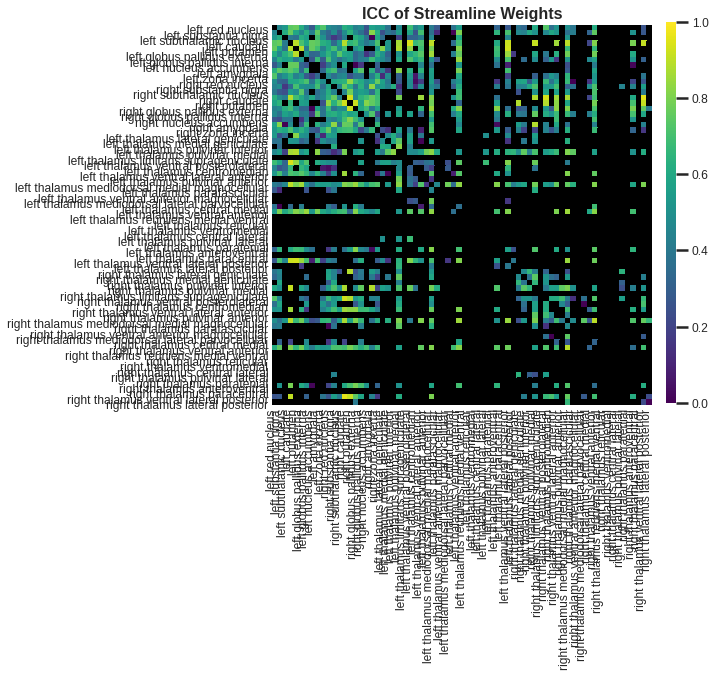

In [82]:
# Plot ICC
%matplotlib inline

f, ax = plt.subplots(1, 1, figsize=(14, 7))

# Average
cbar_ax1 = f.add_axes([0.715, 0.13, 0.01, 0.755])
sns.heatmap(
    df_icc_mat,
    ax=ax,
    cmap="viridis",
    vmin=0,
    vmax=1,
    square=True,
    cbar_ax=cbar_ax1,
)
ax.set_title("ICC of Streamline Weights")

ax.tick_params(axis="both", length=0)
ax.set_xticks(np.arange(len(parcellation_map.reindex(index=reindex_list)["Nuclei"])))
ax.set_xticklabels(
    parcellation_map.reindex(index=reindex_list)["Nuclei"], va="top", ha="center"
)
ax.set_yticks(np.arange(len(parcellation_map.reindex(index=reindex_list)["Nuclei"])))
ax.set_yticklabels(
    parcellation_map.reindex(index=reindex_list)["Nuclei"],
    rotation=0,
    va="top",
    ha="right",
)

filename = "{0}/comparison_streamline_icc.svg".format(figure_dir)
# plt.savefig(filename, dpi=300, bbox_inches="tight", facecolor="white")

plt.show()
plt.close()

In [83]:
# Left
df_icc_mat["Nuclei"] = parcellation_map.reindex(index=reindex_list)["Nuclei"]
df_icc_mat = df_icc_mat.sort_values(by=["Nuclei"])
df_icc_mat = df_icc_mat.reindex(columns=df_icc_mat.index.tolist())

diff_value = df_icc_mat.iloc[0:35, 0:35].to_numpy()[np.triu_indices(35, k=1)]
hemi = ["Left" for i in range(len(diff_value))]

# Right
diff_R = df_icc_mat.iloc[35:70, 35:70].to_numpy()[np.triu_indices(35, k=1)]
diff_value = np.append(diff_value, diff_R)
hemi = np.append(hemi, ["Right" for i in range(len(diff_R))])

# Inter
diff_int = df_icc_mat.iloc[0:35, 35:70]
diff_int = diff_int.values.flatten()
diff_value = np.append(diff_value, diff_int)

hemi = np.append(hemi, ["Inter" for i in range(len(diff_int))])

# Dataframe
df_icc_diff = pd.DataFrame({"Value": diff_value, "Hemi": hemi})

del diff_value, hemi, diff_R, diff_int

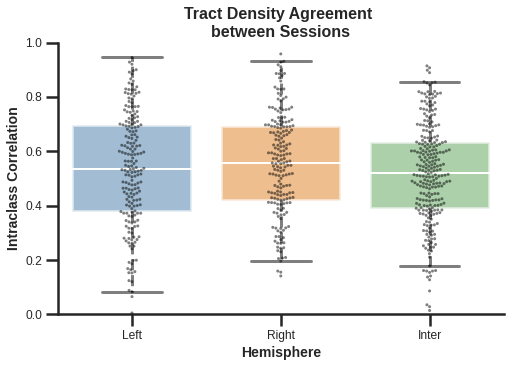

In [84]:
# Plot hemispheric differences
%matplotlib inline

fig, ax = plt.subplots(1, 1, figsize=(8, 5))

sns.boxplot(
    data=df_icc_diff,
    x="Hemi",
    y="Value",
    hue="Hemi",
    dodge=False,
    boxprops=boxprops,
    whiskerprops=whiskerprops,
    capprops=capprops,
    medianprops=medianprops,
    showfliers=False,
    whis=0.95,
)
sns.swarmplot(
    data=df_icc_diff,
    x="Hemi",
    y="Value",
    color="black",
    alpha=0.5,
    dodge=False,
    size=3,
)

ax.set_ylim([0, 1])
ax.get_legend().remove()
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)

plt.title("Tract Density Agreement \nbetween Sessions")
plt.ylabel("Intraclass Correlation")
plt.xlabel("Hemisphere")

filename = "{0}/comparison_hemi_icc.png".format(figure_dir)
# plt.savefig(filename, dpi=300, bbox_inches="tight", facecolor="white")

plt.show()
plt.close()

#### Tract overlap (wDSC)

In [ ]:
dsc_mat = test_conn_mat.copy()

for s, subj in enumerate(tqdm(demographics_df["Subject"].tolist(), position=0)):
    subj = f"sub-{subj}"
    try:
        os.system(
            f"tar -xf {test_dir}/derivatives/mrtpipelines_0.1.6/mrtpipelines/{subj}/tdi/{subj}_tdi.tar -C {test_dir}/derivatives/mrtpipelines_0.1.6/mrtpipelines/{subj}/tdi --wildcards *.nii.gz"
        )
        os.system(
            f"tar -xf {retest_dir}/derivatives/mrtpipelines_0.1.6/mrtpipelines/{subj}/tdi/{subj}_tdi.tar -C {retest_dir}/derivatives/mrtpipelines_0.1.6/mrtpipelines/{subj}/tdi --wildcards *.nii.gz"
        )
    except:
        continue

    dsc = Parallel(n_jobs=n_proc, backend="multiprocessing")(
        delayed(compute_dsc, has_shareable_memory)(subj, node1, node2, weighted=True)
        for (node1, node2) in list(
            itertools.combinations(range(1, dsc_mat.shape[0] + 1), 2)
        )
    )

    dsc_mat[:, :, s] = make_mat(dsc, dsc_mat.shape[0])

    os.system(
        f"rm -f {test_dir}/derivatives/mrtpipelines_0.1.6/mrtpipelines/{subj}/tdi/*.nii.gz"
    )
    os.system(
        f"rm -f {retest_dir}/derivatives/mrtpipelines_0.1.6/mrtpipelines/{subj}/tdi/*.nii.gz"
    )

    del dsc
    clear_output(wait=False)

handle_session(save=True)

100%|██████████| 37/37 [5:47:35<00:00, 563.66s/it]


Saving notebook session


100%|██████████| 37/37 [00:12<00:00,  2.96it/s]


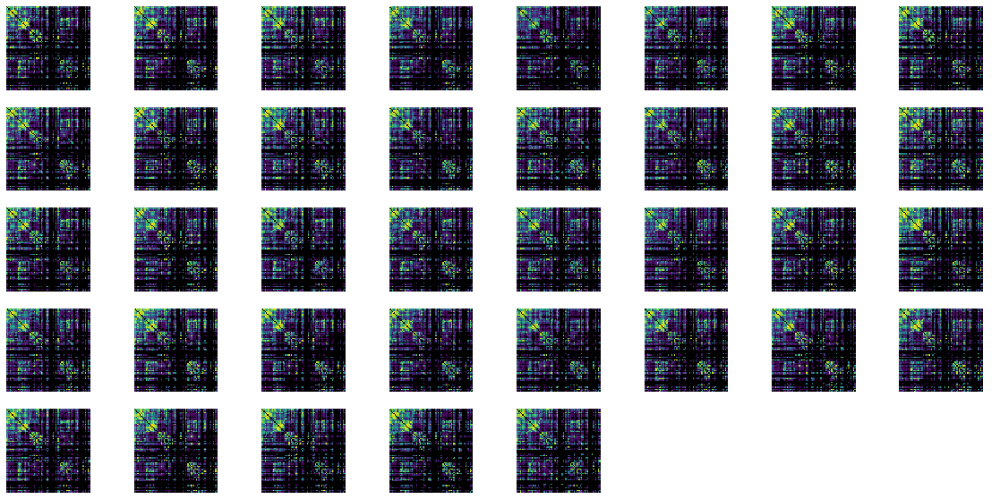

In [44]:
# Plot individual subjects
f, ax = plt.subplots(5, 8, figsize=(20, 10))

for s, _ in enumerate(tqdm(demographics_df["Subject"].tolist())):
    np.fill_diagonal(dsc_mat[:, :, s], np.nan)
    df_dsc_subj = pd.DataFrame(dsc_mat[:, :, s])
#     df_dsc_subj.loc[left_thal, left_thal] = df_dsc_subj.loc[
#             right_thal, right_thal
#         ] = df_dsc_subj.loc[left_striatum, left_striatum] = df_dsc_subj.loc[right_striatum, right_striatum] = np.nan
    df_dsc_subj = df_dsc_subj.drop(index=[14, 15], columns=[14, 15])

    # Reorganize dataframe by hemisphere
    df_dsc_subj = df_dsc_subj.reindex(index=reindex_list, columns=reindex_list)

    sns.heatmap(
        df_dsc_subj,
        ax=ax[int(s / 8)][s % 8],
        cmap="viridis",
        vmin=0,
        vmax=1,
        square=True,
        cbar=None,
    )

    ax[int(s / 8)][s % 8].tick_params(axis="both", length=0)
    ax[int(s / 8)][s % 8].set_xticklabels("", va="top", ha="center")
    ax[int(s / 8)][s % 8].set_yticklabels("", rotation=0, va="top", ha="right")

for ax_i in range(5, 8):
    ax[4][ax_i].set_axis_off()

plt.show()
plt.close()

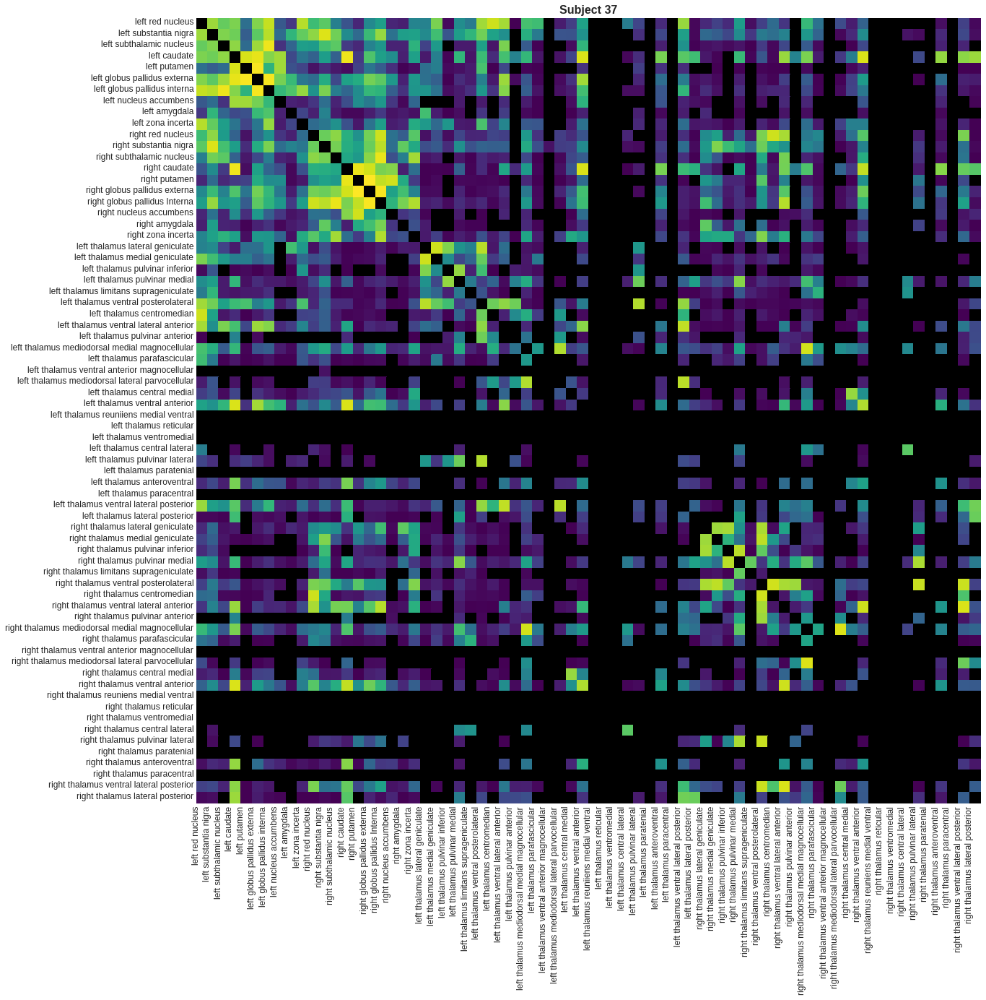

In [89]:
# Plot animation
def update(i):
    df_dsc_subj = pd.DataFrame(dsc_mat[:, :, i])
    #     df_dsc_subj.loc[left_thal, left_thal] = df_dsc_subj.loc[
    #         right_thal, right_thal
    #     ] = np.nan
    df_dsc_subj = df_dsc_subj.drop(index=[14, 15], columns=[14, 15])

    # Reorganize dataframe by hemisphere
    df_dsc_subj = df_dsc_subj.reindex(index=reindex_list, columns=reindex_list)

    graph = sns.heatmap(
        df_dsc_subj,
        ax=ax,
        cmap="viridis",
        vmin=0,
        vmax=1,
        square=True,
        cbar=None,
    )

    ax.set_title("Subject {0}".format(i + 1))
    ax.tick_params(axis="both", length=0)
    ax.set_xticks(
        np.arange(len(parcellation_map.reindex(index=reindex_list)["Nuclei"]))
    )
    ax.set_xticklabels(
        parcellation_map.reindex(index=reindex_list)["Nuclei"],
        rotation=90,
        va="top",
        ha="center",
    )
    ax.set_yticks(
        np.arange(len(parcellation_map.reindex(index=reindex_list)["Nuclei"]))
    )
    ax.set_yticklabels(
        parcellation_map.reindex(index=reindex_list)["Nuclei"],
        rotation=0,
        va="top",
        ha="right",
    )


fig, ax = plt.subplots(1, 1, figsize=(20, 20))
# cbar_ax = fig.add_axes([.880, .13, .02, .755])
ani = FuncAnimation(fig, update, frames=dsc_mat.shape[2], interval=200, repeat=True)

HTML(ani.to_html5_video())

In [290]:
plt.close()

In [222]:
# Compute averages
dsc_avg_mat = np.nanmean(dsc_mat, axis=2)
np.fill_diagonal(dsc_avg_mat, np.nan)

dsc_std_mat = np.nanstd(dsc_mat, axis=2)
np.fill_diagonal(dsc_std_mat, np.nan)

df_dsc_avg = pd.DataFrame(dsc_avg_mat)
# df_dsc_avg.loc[left_thal, left_thal] = df_dsc_avg.loc[right_thal, right_thal] = df_dsc_avg.loc[left_striatum, left_striatum] = df_dsc_avg.loc[right_striatum, right_striatum] = np.nan
df_dsc_avg = df_dsc_avg.drop(index=[14, 15], columns=[14, 15])
df_dsc_std = pd.DataFrame(dsc_std_mat)
# df_dsc_std.loc[left_thal, left_thal] = df_dsc_std.loc[right_thal, right_thal] = df_dsc_std.loc[left_striatum, left_striatum] = df_dsc_std.loc[right_striatum, right_striatum ] = np.nan
df_dsc_std = df_dsc_std.drop(index=[14, 15], columns=[14, 15])

# Reorganize dataframe by hemisphere
df_dsc_avg = df_dsc_avg.reindex(index=reindex_list, columns=reindex_list)
df_dsc_std = df_dsc_std.reindex(index=reindex_list, columns=reindex_list)

/home/ROBARTS/tkai/khan/users/tkai/opt/venv/.jupytervenv/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: Mean of empty slice
  
/home/ROBARTS/tkai/khan/users/tkai/opt/venv/.jupytervenv/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


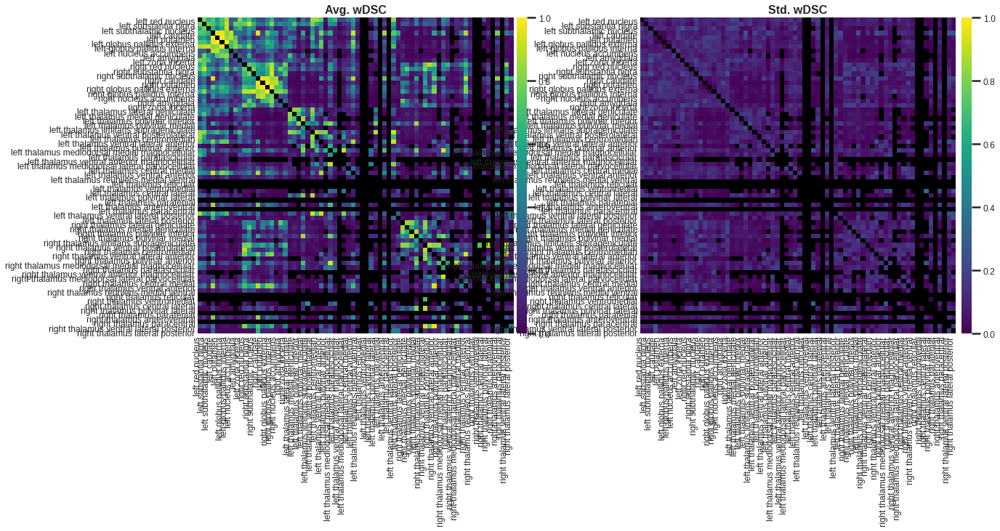

In [223]:
# Plot averages
%matplotlib inline

f, ax = plt.subplots(1, 2, figsize=(20, 8))

# Average
cbar_ax1 = f.add_axes([0.455, 0.125, 0.01, 0.755])
sns.heatmap(
    df_dsc_avg,
    ax=ax[0],
    cmap="viridis",
    vmin=0,
    vmax=1,
    square=True,
    cbar_ax=cbar_ax1,
)
ax[0].set_title("Avg. wDSC")

# Standard Deviation
cbar_ax2 = f.add_axes([0.880, 0.125, 0.01, 0.755])
sns.heatmap(
    df_dsc_std,
    ax=ax[1],
    cmap="viridis",
    vmin=0,
    vmax=1,
    square=True,
    cbar_ax=cbar_ax2,
)
ax[1].set_title("Std. wDSC")

for d in range(2):
    ax[d].tick_params(axis="both", length=0)
    ax[d].set_xticks(
        np.arange(len(parcellation_map.reindex(index=reindex_list)["Nuclei"]))
    )
    ax[d].set_xticklabels(
        parcellation_map.reindex(index=reindex_list)["Nuclei"], va="top", ha="center"
    )
    ax[d].set_yticks(
        np.arange(len(parcellation_map.reindex(index=reindex_list)["Nuclei"]))
    )
    ax[d].set_yticklabels(
        parcellation_map.reindex(index=reindex_list)["Nuclei"],
        rotation=0,
        va="top",
        ha="right",
    )

filename = "{0}/comparison_streamline_iou.svg".format(figure_dir)
# plt.savefig(filename, dpi=300, bbox_inches="tight", facecolor="white")

plt.show()
plt.close()

100%|██████████| 10/10 [00:03<00:00,  2.60it/s]


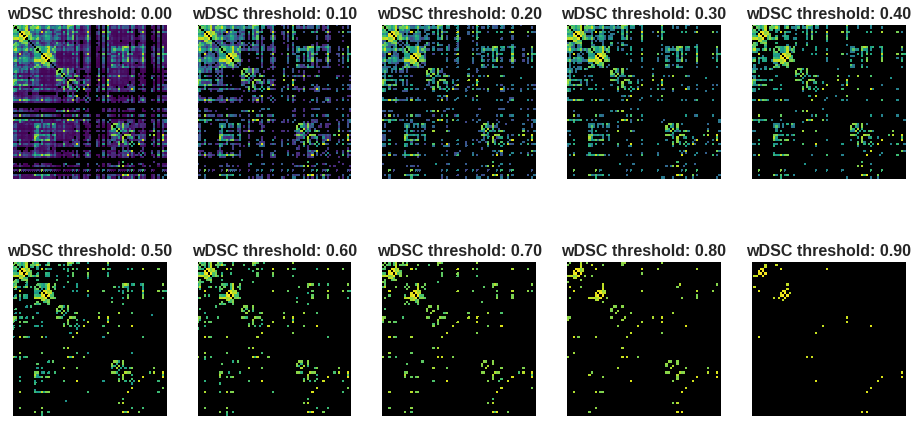

In [224]:
# Avg wDSC at different thresholds
%matplotlib inline 
f, ax = plt.subplots(2,5, figsize=(16,8))

dsc_thresh = np.linspace(0, 1, 11)

for idx in tqdm(range(10)):
    sns.heatmap(
        df_dsc_avg[df_dsc_avg>=dsc_thresh[idx]],
        ax=ax[idx // 5][idx % 5],
        cmap="viridis",
        vmin=0,
        vmax=1,
        square=True,
        cbar=False
    )

    ax[idx // 5][idx % 5].tick_params(axis="both", length=0)
    ax[idx // 5][idx % 5].set_xticks(
        np.arange(len(parcellation_map.reindex(index=reindex_list)["Nuclei"]))
    )
#     ax[idx // 5][idx % 5].set_xticklabels(
#         parcellation_map.reindex(index=reindex_list)["Nuclei"], va="top", ha="center", rotation=-90
#     )
    ax[idx // 5][idx % 5].set_xticklabels([])
    ax[idx // 5][idx % 5].set_yticks(
        np.arange(len(parcellation_map.reindex(index=reindex_list)["Nuclei"]))
    )
#     ax[idx // 5][idx % 5].set_yticklabels(
#         parcellation_map.reindex(index=reindex_list)["Nuclei"],
#         rotation=0,
#         va="top",
#         ha="right",
#     )
    ax[idx // 5][idx % 5].set_yticklabels([])
    ax[idx // 5][idx % 5].set_title(f"wDSC threshold: {dsc_thresh[idx]:.2f}")

# plt.savefig("/home/ROBARTS/tkai/Desktop/subcortical_thresholded-0.7.png", dpi=300, bbox_inches="tight", facecolor="white")

plt.show()
plt.close()

In [38]:
# Reorder matrix to grab appropriate labels
df_dsc_avg["Nuclei"] = parcellation_map.reindex(index=reindex_list)["Nuclei"]
df_dsc_avg = df_dsc_avg.sort_values(by=["Nuclei"])
df_dsc_avg = df_dsc_avg.reindex(columns=df_dsc_avg.index.tolist())

# Left
diff_value = df_dsc_avg.iloc[0:35, 0:35].to_numpy()[np.triu_indices(35, k=1)]
hemi = ["Left" for i in range(len(diff_value))]

# Right
diff_R = df_dsc_avg.iloc[35:70, 35:70].to_numpy()[np.triu_indices(35, k=1)]
diff_value = np.append(diff_value, diff_R)
hemi = np.append(hemi, ["Right" for i in range(len(diff_R))])

# Inter
diff_int = df_dsc_avg.iloc[
    0:35, 35:70
] 
diff_int = diff_int.values.flatten()
diff_value = np.append(diff_value, diff_int)

hemi = np.append(hemi, ["Inter" for i in range(len(diff_int))])

# Dataframe
df_dsc_diff = pd.DataFrame({"Value": diff_value, "Hemi": hemi})

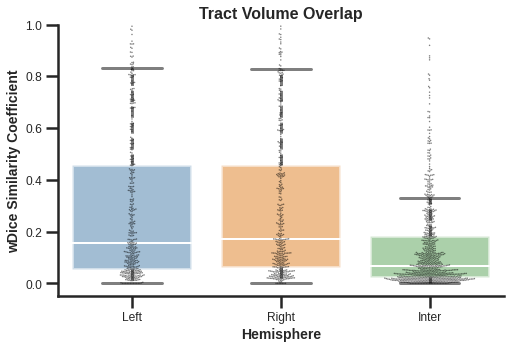

In [47]:
# Plot hemispheric differences
%matplotlib inline

fig, ax = plt.subplots(1, 1, figsize=(8, 5))

sns.boxplot(
    data=df_dsc_diff,
    x="Hemi",
    y="Value",
    hue="Hemi",
    dodge=False,
    boxprops=boxprops,
    whiskerprops=whiskerprops,
    capprops=capprops,
    medianprops=medianprops,
    showfliers=False,
    whis=0.95,
)
sns.swarmplot(
    data=df_dsc_diff,
    x="Hemi",
    y="Value",
    color="black",
    alpha=0.5,
    dodge=False,
    size=1.5,
)

ax.set_ylim([-0.05, 1])
ax.get_legend().remove()
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)

plt.title("Tract Volume Overlap")
plt.ylabel("wDice Similarity Coefficient")
plt.xlabel("Hemisphere")

filename = "{0}/comparison_hemi_overlap.png".format(figure_dir)
# plt.savefig(filename, dpi=300, bbox_inches="tight", facecolor="white")

plt.show()
plt.close()

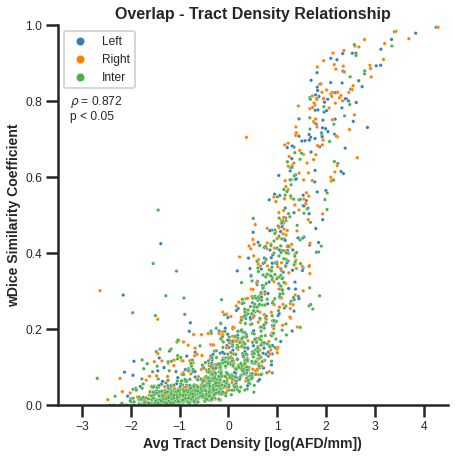

In [48]:
df_test_retest["dsc"] = df_dsc_diff["Value"]

# Plot individual stats (COLORBAR TO BE FIXED)
%matplotlib inline

f, ax = plt.subplots(1, 1, figsize=(7, 7))

df = df_test_retest

sns.scatterplot(data=df, x="Avg", y="dsc", hue="Hemi", ax=ax, s=12)

# Test for normality
stats_sym = "$\\rho$"
pstats = stats.spearmanr(df["Avg"], df["dsc"], nan_policy="omit")

# Legend parms
ax.legend(fontsize=12, markerscale=0.5, loc="upper left")

# Plot params
ax.text(
    -3.25,
    0.75,
    f"""{stats_sym} = {pstats[0]:.3f}
p < 0.05""",
    fontsize=12,
)
ax.set_xlim([-3.5, 4.5])
ax.set_ylim([0, 1])
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)

ax.set_ylabel("wDice Similarity Coefficient")
ax.set_xlabel("Avg Tract Density [log(AFD/mm])")
ax.set_title("Overlap - Tract Density Relationship")

# filename = "{0}/overlap_density_scatter.png".format(figure_dir)
# plt.savefig(filename, dpi=300, bbox_inches="tight", facecolor="white")

plt.show()
plt.close()

#### Motor Circuit (Delong)

In [142]:
# Grab wDSC between motor circuit (Delong) nodes
# 3 (SNr), 5 (STN), 7 (Caudate), 9 (Putamen), 11 (GPe), 13 (GPi), 19 (Amygdala), 
# 35 (ThalCM), 37 (ThalVLa), 41 (ThalMDmc), 43 (ThalPf), 47 (ThalMDpc), 51 (ThalVA), 57 (ThalVM), 69 (ThalVLp)

# Get node names
node_names = ["SN", "STN", "Caudate", "Putamen", "GPe", "GPi", "Amygdala", "Thal CM", "Thal VLa", "Thal MDmc", "Thal Pf", "Thal MDpc", "Thal VA", "Thal VM", "Thal VLp"]
l_node_names = [f"L {node}" for node in node_names]
node_names.reverse()
r_node_names = [f"R {node}" for node in node_names]
final_node_names = l_node_names + r_node_names

# Get connectivity
delong_l_conn = ["3-9", "5-11", "5-13", "9-11", "9-13", "9-35", "9-43", "13-37", "13-57", "13-69"]
delong_r_conn = []
for conn in delong_l_conn:
    idx1, idx2 = conn.split("-")
    delong_r_conn.append(f"{int(idx1)+1}-{int(idx2)+1}")
delong_r_conn.reverse()
delong_conn = delong_l_conn + delong_r_conn
delong_conn_dsc = np.asarray([df_subconn[df_subconn["Nodes"] == node]["Tract Overlap (wDSC)"].mean() for node in delong_conn])
delong_conn_test = np.asarray([df_subconn[df_subconn["Nodes"] == node]["Test Density [log10]"].mean() for node in delong_conn])
delong_conn_retest = np.asarray([df_subconn[df_subconn["Nodes"] == node]["Retest Density [log10]"].mean() for node in delong_conn])

# Map connectivity for chord diagram
delong_conn_l_idx1 = [0, 1, 1, 3, 3, 3, 3, 5, 5, 5] 
delong_conn_l_idx2 = [3, 4, 5, 4, 5, 7, 10, 8, 13, 14]
delong_conn_r_idx1 = [len(final_node_names) - 1 - val for val in delong_conn_l_idx1]; delong_conn_r_idx1.reverse()
delong_conn_r_idx2 = [len(final_node_names) - 1 - val for val in delong_conn_l_idx2]; delong_conn_r_idx2.reverse()
delong_conn_idx1 = delong_conn_l_idx1 + delong_conn_r_idx1
delong_conn_idx2 = delong_conn_l_idx2 + delong_conn_r_idx2

# Create a squared matrix
motor_mat_dsc = np.zeros((len(final_node_names), len(final_node_names)))
motor_mat_test = np.zeros((len(final_node_names), len(final_node_names)))
motor_mat_retest = np.zeros((len(final_node_names), len(final_node_names)))
for idx in range(len(delong_conn_idx1)):
    motor_mat_dsc[delong_conn_idx1[idx], delong_conn_idx2[idx]] = delong_conn_dsc[idx]
    motor_mat_dsc[delong_conn_idx2[idx], delong_conn_idx1[idx]] = delong_conn_dsc[idx]
    
    motor_mat_test[delong_conn_idx1[idx], delong_conn_idx2[idx]] = delong_conn_test[idx]
    motor_mat_test[delong_conn_idx2[idx], delong_conn_idx1[idx]] = delong_conn_test[idx]
    
    motor_mat_retest[delong_conn_idx1[idx], delong_conn_idx2[idx]] = delong_conn_retest[idx]
    motor_mat_retest[delong_conn_idx2[idx], delong_conn_idx1[idx]] = delong_conn_retest[idx]
    
motor_mat_dsc[motor_mat_dsc == 0] = np.nan
motor_mat_test[motor_mat_test == 0] = np.nan
motor_mat_retest[motor_mat_retest == 0] = np.nan
motor_mat_dsc[motor_mat_dsc >= 0.53] = np.nan

#### Associative Circuit

In [126]:
# Grab wDSC between associative circuit nodes
# 3 (SNr), 5 (STN), 7 (Caudate), 9 (Putamen), 11 (GPe), 13 (GPi), 19 (Amygdala), 
# 35 (ThalCM), 37 (ThalVLa), 41 (ThalMDmc), 43 (ThalPf), 47 (ThalMDpc), 51 (ThalVA), 57 (ThalVM), 69 (ThalVLp)

# Get node names
node_names = ["SN", "STN", "Caudate", "Putamen", "GPe", "GPi", "Amygdala", "Thal CM", "Thal VLa", "Thal MDmc", "Thal Pf", "Thal MDpc", "Thal VA", "Thal VM", "Thal VLp"]
l_node_names = [f"L {node}" for node in node_names]
node_names.reverse()
r_node_names = [f"R {node}" for node in node_names]
final_node_names = l_node_names + r_node_names

# Get connectivity
delong_l_conn = ["5-11", "5-13", "7-11", "7-13", "9-11", "11-13", "13-51"]
delong_r_conn = []
for conn in delong_l_conn:
    idx1, idx2 = conn.split("-")
    delong_r_conn.append(f"{int(idx1)+1}-{int(idx2)+1}")
delong_r_conn.reverse()
delong_conn = delong_l_conn + delong_r_conn
delong_conn_dsc = np.asarray([df_subconn[df_subconn["Nodes"] == node]["Tract Overlap (wDSC)"].mean() for node in delong_conn])
delong_conn_test = np.asarray([df_subconn[df_subconn["Nodes"] == node]["Test Density [log10]"].mean() for node in delong_conn])
delong_conn_retest = np.asarray([df_subconn[df_subconn["Nodes"] == node]["Retest Density [log10]"].mean() for node in delong_conn])

# Map connectivity for chord diagram
delong_conn_l_idx1 = [1, 1, 2, 2, 3, 4, 5] 
delong_conn_l_idx2 = [4, 5, 4, 5, 4, 5, 12]
delong_conn_r_idx1 = [len(final_node_names) - 1 - val for val in delong_conn_l_idx1]; delong_conn_r_idx1.reverse()
delong_conn_r_idx2 = [len(final_node_names) - 1 - val for val in delong_conn_l_idx2]; delong_conn_r_idx2.reverse()
delong_conn_idx1 = delong_conn_l_idx1 + delong_conn_r_idx1
delong_conn_idx2 = delong_conn_l_idx2 + delong_conn_r_idx2

# Create a squared matrix
assoc_mat_dsc = np.zeros((len(final_node_names), len(final_node_names)))
assoc_mat_test = np.zeros((len(final_node_names), len(final_node_names)))
assoc_mat_retest = np.zeros((len(final_node_names), len(final_node_names)))
for idx in range(len(delong_conn_idx1)):
    assoc_mat_dsc[delong_conn_idx1[idx], delong_conn_idx2[idx]] = delong_conn_dsc[idx]
    assoc_mat_dsc[delong_conn_idx2[idx], delong_conn_idx1[idx]] = delong_conn_dsc[idx]
    
    assoc_mat_test[delong_conn_idx1[idx], delong_conn_idx2[idx]] = delong_conn_test[idx]
    assoc_mat_test[delong_conn_idx2[idx], delong_conn_idx1[idx]] = delong_conn_test[idx]
    
    assoc_mat_retest[delong_conn_idx1[idx], delong_conn_idx2[idx]] = delong_conn_retest[idx]
    assoc_mat_retest[delong_conn_idx2[idx], delong_conn_idx1[idx]] = delong_conn_retest[idx]
    
assoc_mat_dsc[assoc_mat_dsc == 0] = np.nan
assoc_mat_test[assoc_mat_test == 0] = np.nan
assoc_mat_retest[assoc_mat_retest == 0] = np.nan
assoc_mat_dsc[assoc_mat_dsc >= 0.53] = np.nan

#### Limbic Circuit

In [143]:
# Grab wDSC between associative circuit (Delong) nodes
# 3 (SNr), 5 (STN), 7 (Caudate), 9 (Putamen), 11 (GPe), 13 (GPi), 19 (Amygdala), 
# 35 (ThalCM), 37 (ThalVLa), 41 (ThalMDmc), 43 (ThalPf), 47 (ThalMDpc), 51 (ThalVA), 57 (ThalVM), 69 (ThalVLp)

# Get node names
node_names = ["SN", "STN", "Caudate", "Putamen", "GPe", "GPi", "Amygdala", "Thal CM", "Thal VLa", "Thal MDmc", "Thal Pf", "Thal MDpc", "Thal VA", "Thal VM", "Thal VLp"]
l_node_names = [f"L {node}" for node in node_names]
node_names.reverse()
r_node_names = [f"R {node}" for node in node_names]
final_node_names = l_node_names + r_node_names

# Get connectivity
delong_l_conn = ["5-11", "5-13", "7-19", "9-13", "9-19", "13-41", "13-47"]
delong_r_conn = []
for conn in delong_l_conn:
    idx1, idx2 = conn.split("-")
    delong_r_conn.append(f"{int(idx1)+1}-{int(idx2)+1}")
delong_r_conn.reverse()
delong_conn = delong_l_conn + delong_r_conn
delong_conn_dsc = np.asarray([df_subconn[df_subconn["Nodes"] == node]["Tract Overlap (wDSC)"].mean() for node in delong_conn])
delong_conn_test = np.asarray([df_subconn[df_subconn["Nodes"] == node]["Test Density [log10]"].mean() for node in delong_conn])
delong_conn_retest = np.asarray([df_subconn[df_subconn["Nodes"] == node]["Retest Density [log10]"].mean() for node in delong_conn])

# Map connectivity for chord diagram
delong_conn_l_idx1 = [1, 1, 2, 3, 3, 5, 5] 
delong_conn_l_idx2 = [4, 5, 6, 5, 6, 9, 11]
delong_conn_r_idx1 = [len(final_node_names) - 1 - val for val in delong_conn_l_idx1]; delong_conn_r_idx1.reverse()
delong_conn_r_idx2 = [len(final_node_names) - 1 - val for val in delong_conn_l_idx2]; delong_conn_r_idx2.reverse()
delong_conn_idx1 = delong_conn_l_idx1 + delong_conn_r_idx1
delong_conn_idx2 = delong_conn_l_idx2 + delong_conn_r_idx2

# Create a squared matrix
limbic_mat_dsc = np.zeros((len(final_node_names), len(final_node_names)))
limbic_mat_test = np.zeros((len(final_node_names), len(final_node_names)))
limbic_mat_retest = np.zeros((len(final_node_names), len(final_node_names)))
for idx in range(len(delong_conn_idx1)):
    limbic_mat_dsc[delong_conn_idx1[idx], delong_conn_idx2[idx]] = delong_conn_dsc[idx]
    limbic_mat_dsc[delong_conn_idx2[idx], delong_conn_idx1[idx]] = delong_conn_dsc[idx]
    
    limbic_mat_test[delong_conn_idx1[idx], delong_conn_idx2[idx]] = delong_conn_test[idx]
    limbic_mat_test[delong_conn_idx2[idx], delong_conn_idx1[idx]] = delong_conn_test[idx]
    
    limbic_mat_retest[delong_conn_idx1[idx], delong_conn_idx2[idx]] = delong_conn_retest[idx]
    limbic_mat_retest[delong_conn_idx2[idx], delong_conn_idx1[idx]] = delong_conn_retest[idx]
    
limbic_mat_dsc[limbic_mat_dsc == 0] = np.nan
limbic_mat_test[limbic_mat_test == 0] = np.nan
limbic_mat_retest[limbic_mat_retest == 0] = np.nan
limbic_mat_dsc[limbic_mat_dsc >= 0.53] = np.nan

#### Density thresholding

In [4]:
df_avg = np.nanmean([np.nanmean(test_conn_mat, axis=2), np.nanmean(retest_conn_mat, axis=2)], axis=0)
df_avg = pd.DataFrame(df_avg)

In [37]:
min_density = df_subconn["Avg Density"].describe()["min"]
max_density = df_subconn["Avg Density"].describe()["max"]

density_thresh = np.arange(min_density, max_density, .25)

avg_dsc = []
for idx in tqdm(range(len(density_thresh))):
    dsc_threshed = df_dsc_avg[df_avg >= density_thresh[idx]]
    avg_dsc.append(np.nanmean(dsc_threshed))
    
density_diff = np.diff(density_thresh)
dsc_diff = np.diff(avg_dsc)
rate = dsc_diff / density_diff
rate = np.insert(rate, 0, 0)

 59%|█████▉    | 78605/133392 [02:30<01:43, 528.77it/s]/home/ROBARTS/tkai/khan/users/tkai/opt/venv/.jupytervenv/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: Mean of empty slice
  if __name__ == '__main__':
100%|██████████| 133392/133392 [04:15<00:00, 522.30it/s]


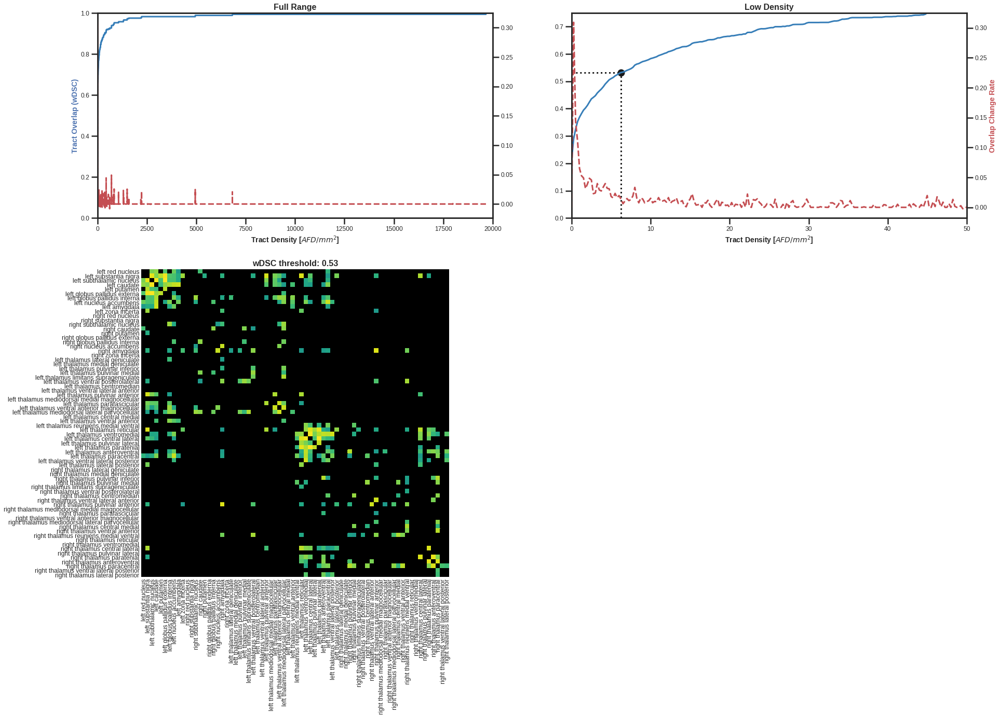

In [141]:
fig, (ax, ax2) = plt.subplots(2,2, figsize=(30, 20), gridspec_kw={"height_ratios": [0.4, 0.6]})
ax0_twin = ax[0].twinx()
ax1_twin = ax[1].twinx()

density_idx = np.argwhere(density_thresh <= 50)[-1][0]
thresh_idx = 25 # Sets density to threshold to 10, where rate of change in overlap is minimum

ax[0].plot(density_thresh, avg_dsc)
ax0_twin.plot(density_thresh, rate, color="r", linestyle="--")
ax[0].set_ylabel("Tract Overlap (wDSC)", color="b")
ax[0].set_xlabel("Tract Density [$AFD/mm^2$]")
ax0_twin.set_ylabel("")
ax[0].set_title("Full Range")
ax[0].set_xlim([0, 20000])
ax[0].set_ylim([0, 1])

ax[1].plot(density_thresh[:density_idx+1], avg_dsc[:density_idx+1])
ax[1].hlines(y=avg_dsc[thresh_idx], xmin=-0, xmax=density_thresh[thresh_idx], linestyle="dotted", color="k")
ax[1].vlines(x=density_thresh[thresh_idx], ymin=0, ymax=avg_dsc[thresh_idx], linestyle="dotted", color="k")
ax[1].scatter(x=density_thresh[thresh_idx], y=avg_dsc[thresh_idx], color="k")
ax1_twin.plot(density_thresh[:density_idx+1], rate[:density_idx+1], color="r", linestyle="--")
ax[1].set_ylabel("")
ax[1].set_xlabel("Tract Density [$AFD/mm^2$]")
ax1_twin.set_ylabel("Overlap Change Rate", color="r")
ax[1].set_xlim([0, 50])
ax[1].set_ylim([0, 0.75])
ax[1].set_title("Low Density")

sns.heatmap(
    df_dsc_avg[df_dsc_avg>=avg_dsc[thresh_idx]],
    ax=ax2[0],
    cmap="viridis",
    vmin=0,
    vmax=1,
    square=True,
    cbar=False
)

ax2[0].tick_params(axis="both", length=0)
ax2[0].set_xticks(
    np.arange(len(parcellation_map.reindex(index=reindex_list)["Nuclei"]))
)
ax2[0].set_xticklabels(
        parcellation_map.reindex(index=reindex_list)["Nuclei"], va="top", ha="left", rotation=90
    )
ax2[0].set_yticks(
    np.arange(len(parcellation_map.reindex(index=reindex_list)["Nuclei"]))
)
ax2[0].set_yticklabels(
        parcellation_map.reindex(index=reindex_list)["Nuclei"], va="top", ha="right", rotation=0
    )
ax2[0].set_title(f"wDSC threshold: {avg_dsc[thresh_idx]:.2f}")

ax2[1].axis("off")

# plt.savefig("/home/ROBARTS/tkai/Desktop/thresh_fig.jpg", dpi=300)

plt.show()
plt.close()

In [122]:
# Create a base spreadsheet of connectivity surviving threshold
df_temp = df_subconn.groupby("Nodes").mean()
df_temp = df_temp[df_temp["Tract Overlap (wDSC)"] >= avg_dsc[thresh_idx]]
df_temp = df_temp.reset_index()
df_temp = df_temp[["Nodes", "Node 1 Size [log]", "Node 2 Size [log]"]]
df_temp["Node 1"] = ""
df_temp["Node 2"] = ""
df_temp["Hemi"] = ""
df_temp["Notes"] = ""

for idx, row in df_temp.iterrows():
    node1, node2 = row["Nodes"].split("-")
    
    if check_hemi(int(node1)) == check_hemi(int(node2)):
        df_temp.at[idx, "Hemi"] = "Left" if check_hemi(int(node1)) == "Odd" else "Right"
    else:
        df_temp.at[idx, "Hemi"] = "Inter"
    
    df_temp.at[idx, "Node 1"] = parcellation_map[parcellation_map["Label"] == int(node1)]["Nuclei"].values[0]
    df_temp.at[idx, "Node 2"] = parcellation_map[parcellation_map["Label"] == int(node2)]["Nuclei"].values[0]
    
df_temp.to_csv("hcp1200_3T_TestvRetest_Thresholded.csv", index=False)

#### Test - `ft` masked connectivity matrix

In [4]:
# Read in subject and node data
for subjIdx, subj in enumerate(tqdm(demographics_df["Subject"].tolist())):
    subj = f"sub-{subj}"
    csv_file = f"{test_dir}/derivatives/mrtpipelines_0.1.6/mrtpipelines/{subj}/tractography/masked/{subj}_space-dwi_desc-ft_subcortical_nodeweights.csv"

    if subjIdx is 0:
        test_ft_conn_mat = np.genfromtxt(csv_file, delimiter=" ")
        test_ft_conn_mat = test_ft_conn_mat[:, :, np.newaxis]
    else:
        temp_mat = np.genfromtxt(csv_file, delimiter=" ")
        temp_mat = temp_mat[:, :, np.newaxis]
        test_ft_conn_mat = np.append(test_ft_conn_mat, temp_mat, axis=2)

100%|██████████| 37/37 [00:02<00:00, 15.39it/s]


In [29]:
# Arrange by splitting left and right hemispheres
# Make sure 1 hemisphere is in reverse order for chord plot
# Drop hippocampal labels
temp_reindex = np.concatenate((np.arange(0, 72, 2), np.arange(71, 0, -2)))
temp_reindex = temp_reindex[(temp_reindex != 14) & (temp_reindex != 15)]
temp_reindex

array([ 0,  2,  4,  6,  8, 10, 12, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34,
       36, 38, 40, 42, 44, 46, 48, 50, 52, 54, 56, 58, 60, 62, 64, 66, 68,
       70, 71, 69, 67, 65, 63, 61, 59, 57, 55, 53, 51, 49, 47, 45, 43, 41,
       39, 37, 35, 33, 31, 29, 27, 25, 23, 21, 19, 17, 13, 11,  9,  7,  5,
        3,  1])

  0%|          | 0/37 [00:00<?, ?it/s]/home/ROBARTS/tkai/khan/users/tkai/opt/venv/.jupytervenv/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in log10
  # This is added back by InteractiveShellApp.init_path()
100%|██████████| 37/37 [00:12<00:00,  2.95it/s]


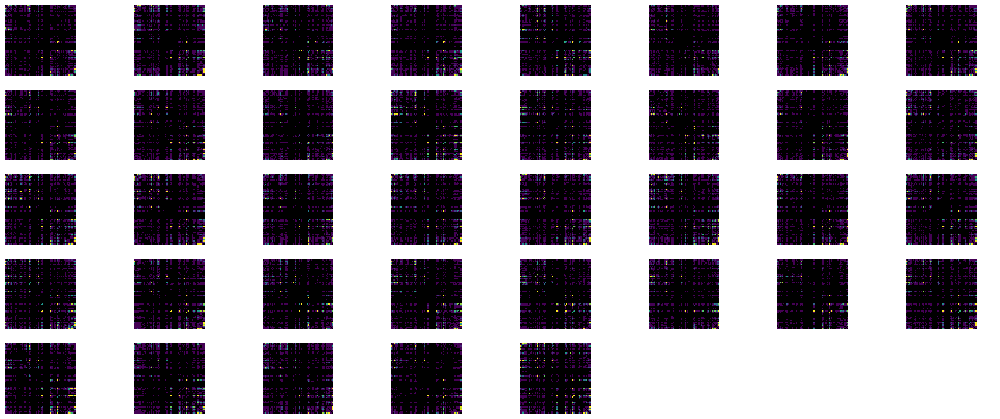

In [16]:
f, ax = plt.subplots(5, 8, figsize=(24, 10))

for s in tqdm(range(len(demographics_df["Subject"].tolist()))):
    df_test_subj_ft = pd.DataFrame(test_ft_conn_mat[:, :, s])
    df_test_subj_ft = df_test_subj_ft.drop(index=[14, 15], columns=[14, 15])
    df_test_subj_ft["nuclei"] = parcellation_map["Nuclei"]
    df_test_subj_ft = df_test_subj_ft.reindex(index=temp_reindex, columns=temp_reindex)

    # Plot
    sns.heatmap(
        np.log10(df_test_subj_ft),
        ax=ax[int(s / 8)][s % 8],
        cmap="viridis",
        vmin=0,
        vmax=1,
        square=True,
        cbar=None,
    )

    ax[int(s / 8)][s % 8].tick_params(axis="both", length=0)
    ax[int(s / 8)][s % 8].set_xticklabels("", va="top", ha="center")
    ax[int(s / 8)][s % 8].set_yticklabels("", rotation=0, va="top", ha="right")
    
for ax_i in range(5, 8):
    ax[4][ax_i].set_axis_off()

plt.show()
plt.close()

In [30]:
test_ft_conn_avgmat = np.mean(test_ft_conn_mat, axis=2)
test_ft_conn_stdmat = np.std(test_ft_conn_mat, axis=2)
test_ft_conn_covmat = test_ft_conn_stdmat / test_ft_conn_avgmat

df_test_avg_subconn_ft = pd.DataFrame(test_ft_conn_avgmat)
# df_test_avg_subconn.loc[left_thal, left_thal] = df_test_avg_subconn.loc[
#     right_thal, right_thal
# ] = np.nan
df_test_avg_subconn_ft = df_test_avg_subconn_ft.drop(index=[14, 15], columns=[14, 15])
df_test_std_subconn_ft = pd.DataFrame(test_ft_conn_stdmat)
# df_test_std_subconn.loc[left_thal, left_thal] = df_test_std_subconn.loc[
#     right_thal, right_thal
# ] = np.nan
df_test_std_subconn_ft = df_test_std_subconn_ft.drop(index=[14, 15], columns=[14, 15])
df_test_cov_subconn_ft = pd.DataFrame(test_ft_conn_covmat)
# df_test_cov_subconn.loc[left_thal, left_thal] = df_test_cov_subconn.loc[
#     right_thal, right_thal
# ] = np.nan
df_test_cov_subconn_ft = df_test_cov_subconn_ft.drop(index=[14, 15], columns=[14, 15])

# Add hemisphere and nuclei information
df_test_avg_subconn_ft["nuclei"] = df_test_std_subconn_ft["nuclei"] = df_test_cov_subconn_ft[
    "nuclei"
] = parcellation_map["Nuclei"]

# Reorganize dataframe by hemisphere
df_test_avg_subconn_ft = df_test_avg_subconn_ft.reindex(
    index=temp_reindex, columns=temp_reindex
)
df_test_std_subconn_ft = df_test_std_subconn_ft.reindex(
    index=temp_reindex, columns=temp_reindex
)
df_test_cov_subconn_ft = df_test_cov_subconn_ft.reindex(
    index=temp_reindex, columns=temp_reindex
)

/home/ROBARTS/tkai/khan/users/tkai/opt/venv/.jupytervenv/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


/home/ROBARTS/tkai/khan/users/tkai/opt/venv/.jupytervenv/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log10
  if __name__ == '__main__':
/home/ROBARTS/tkai/khan/users/tkai/opt/venv/.jupytervenv/lib/python3.7/site-packages/ipykernel_launcher.py:23: RuntimeWarning: divide by zero encountered in log10


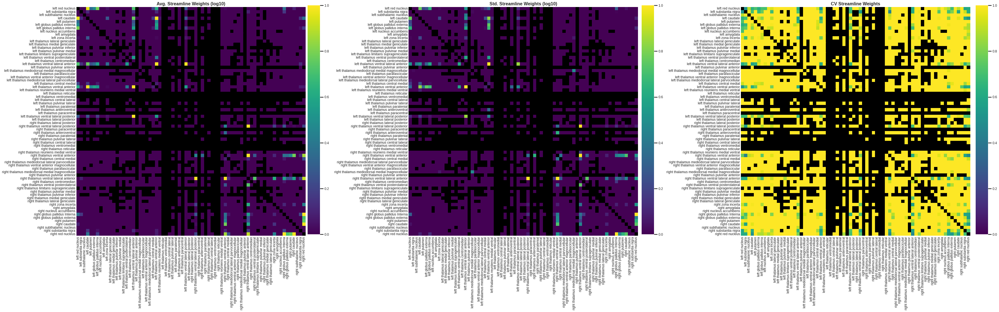

In [31]:
# Plot group stats
%matplotlib inline

f, ax = plt.subplots(1, 3, figsize=(60, 15))

# Average
cbar_ax1 = f.add_axes([0.335, 0.13, 0.01, 0.755])
sns.heatmap(
    np.log10(df_test_avg_subconn_ft),
    ax=ax[0],
    cmap="viridis",
    #     mask=df_test_avg_subconn.drop(columns=["nuclei"]).isnull(),
    vmin=0,
    vmax=1,
    square=True,
    cbar_ax=cbar_ax1,
)
ax[0].set_title("Avg. Streamline Weights (log10)")

# Standard Deviation
cbar_ax2 = f.add_axes([0.610, 0.13, 0.01, 0.755])
sns.heatmap(
    np.log10(df_test_std_subconn_ft),
    ax=ax[1],
    cmap="viridis",
    vmin=0,
    vmax=1,
    square=True,
    cbar_ax=cbar_ax2,
)
ax[1].set_title("Std. Streamline Weights (log10)")

# COV
cbar_ax3 = f.add_axes([0.885, 0.13, 0.01, 0.755])
sns.heatmap(
    df_test_cov_subconn_ft,
    ax=ax[2],
    cmap="viridis",
    vmin=0,
    vmax=1,
    square=True,
    cbar_ax=cbar_ax3,
)
ax[2].set_title("CV Streamline Weights")

# Labels
for d in range(3):
    ax[d].tick_params(axis="both", length=0)
    ax[d].set_xticklabels(
        parcellation_map.reindex(index=temp_reindex)["Nuclei"], va="top", ha="center"
    )
    ax[d].set_yticks(
        np.arange(len(parcellation_map.reindex(index=temp_reindex)["Nuclei"]))
    )
    ax[d].set_yticklabels(
        parcellation_map.reindex(index=temp_reindex)["Nuclei"],
        rotation=0,
        va="top",
        ha="right",
    )

filename = "{0}/test_avg_streamline_weights.svg".format(figure_dir)
# plt.savefig(filename, dpi=300, bbox_inches="tight", facecolor="white")

plt.show()
plt.close()

/home/ROBARTS/tkai/khan/users/tkai/opt/venv/.jupytervenv/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log10
  if __name__ == '__main__':


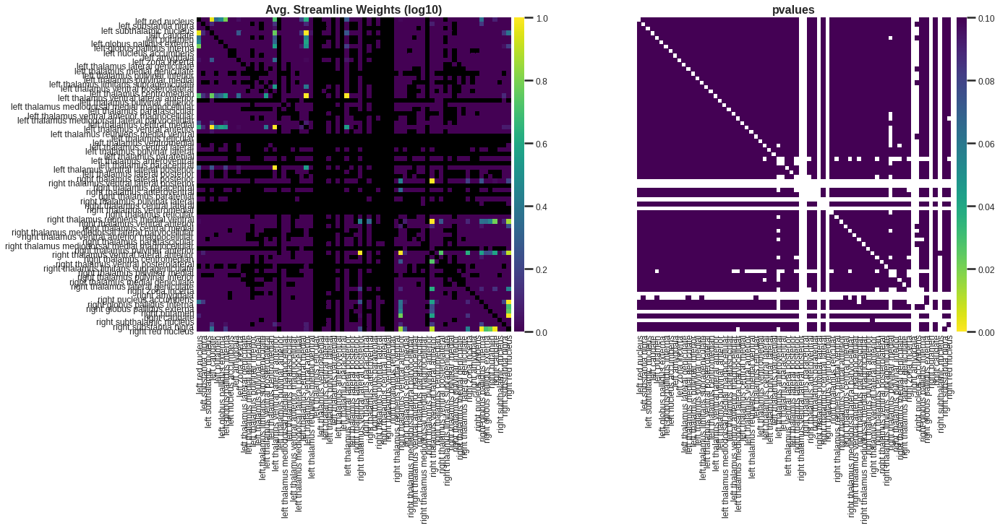

In [32]:
# Plot significant differences
%matplotlib inline

f, ax = plt.subplots(1, 2, figsize=(20, 8))

# Average
cbar_ax1 = f.add_axes([0.455, 0.125, 0.01, 0.755])
sns.heatmap(
    np.log10(df_test_avg_subconn_ft),
    ax=ax[0],
    cmap="viridis",
    vmin=0,
    vmax=1,
    square=True,
    cbar_ax=cbar_ax1,
)
ax[0].set_title("Avg. Streamline Weights (log10)")

# P-Values
cbar_ax2 = f.add_axes([0.880, 0.125, 0.01, 0.755])
sns.heatmap(
    df_pval_mat,
    ax=ax[1],
    cmap="viridis_r",
    vmin=0.0,
    vmax=0.1,
    square=True,
    cbar_ax=cbar_ax2,
)
ax[1].set_title("pvalues")

for d in range(2):
    ax[d].tick_params(axis="both", length=0)
    ax[d].set_xticks(
        np.arange(len(parcellation_map.reindex(index=temp_reindex)["Nuclei"]))
    )
    ax[d].set_xticklabels(
        parcellation_map.reindex(index=temp_reindex)["Nuclei"], va="top", ha="left"
    )
    if d == 0:
        ax[d].set_yticks(
            np.arange(len(parcellation_map.reindex(index=temp_reindex)["Nuclei"]))
        )
        ax[d].set_yticklabels(
            parcellation_map.reindex(index=temp_reindex)["Nuclei"],
            rotation=0,
            va="top",
            ha="right",
        )
    else:
        ax[d].set_yticklabels("")

plt.show()
plt.close()

/home/ROBARTS/tkai/khan/users/tkai/opt/venv/.jupytervenv/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in log10
  import sys


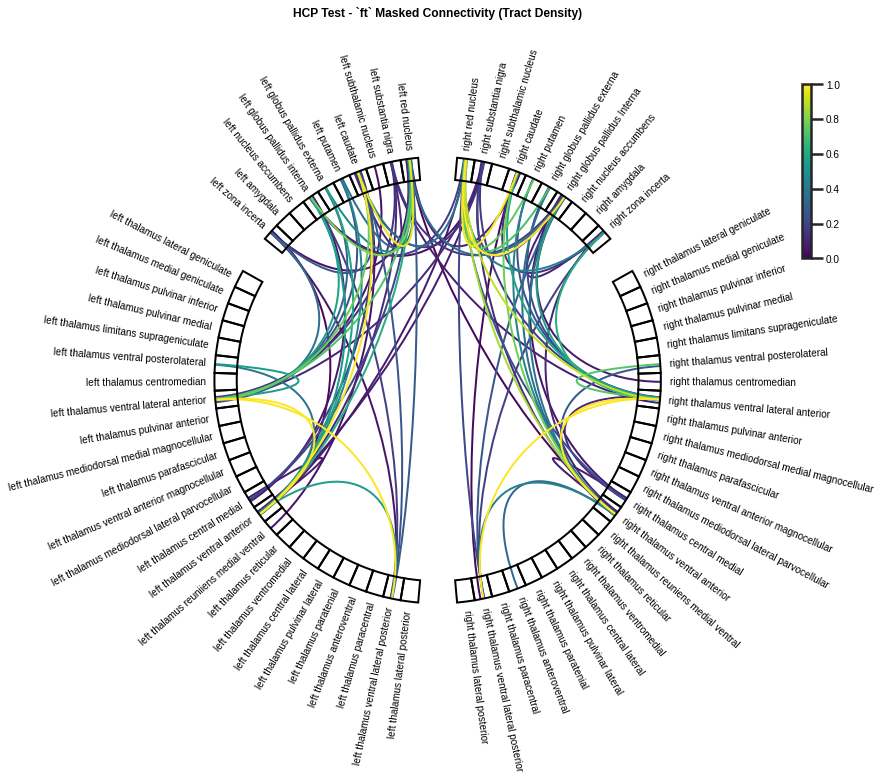

In [43]:
from mne.viz import circular_layout, plot_connectivity_circle as plot_chord

# Get node names
node_names = parcellation_map.reindex(index=temp_reindex)["Nuclei"]

# Get connectivity
ft_conn = np.log10(df_test_avg_subconn_ft.to_numpy())
ft_conn = np.where(ft_conn >= 0, ft_conn, np.nan)

fig = plt.figure(figsize=(16, 16))

node_angles = circular_layout(node_names.tolist(), node_names.tolist(),
                              start_pos=90, 
                              group_boundaries=[0, 10, 35, 60])

plot_chord(ft_conn, node_names.tolist(),
           node_angles=node_angles,
           fig=fig, colorbar_pos=(-0.3, 0.8), 
           colorbar_size=.2, 
           fontsize_colorbar=10, 
           fontsize_names=10, 
           colormap="viridis",
           vmin=0, vmax=1,
           facecolor="white", 
           textcolor="black",
           node_colors=[(0,0,0,0)],
           linewidth=2,
           title="HCP Test - `ft` Masked Connectivity (Tract Density)")

plt.show()
plt.close()

### Figure Creation

#### Figure 2

/home/ROBARTS/tkai/khan/users/tkai/opt/venv/.jupytervenv/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in log10
/home/ROBARTS/tkai/khan/users/tkai/opt/venv/.jupytervenv/lib/python3.7/site-packages/ipykernel_launcher.py:41: RuntimeWarning: divide by zero encountered in log10


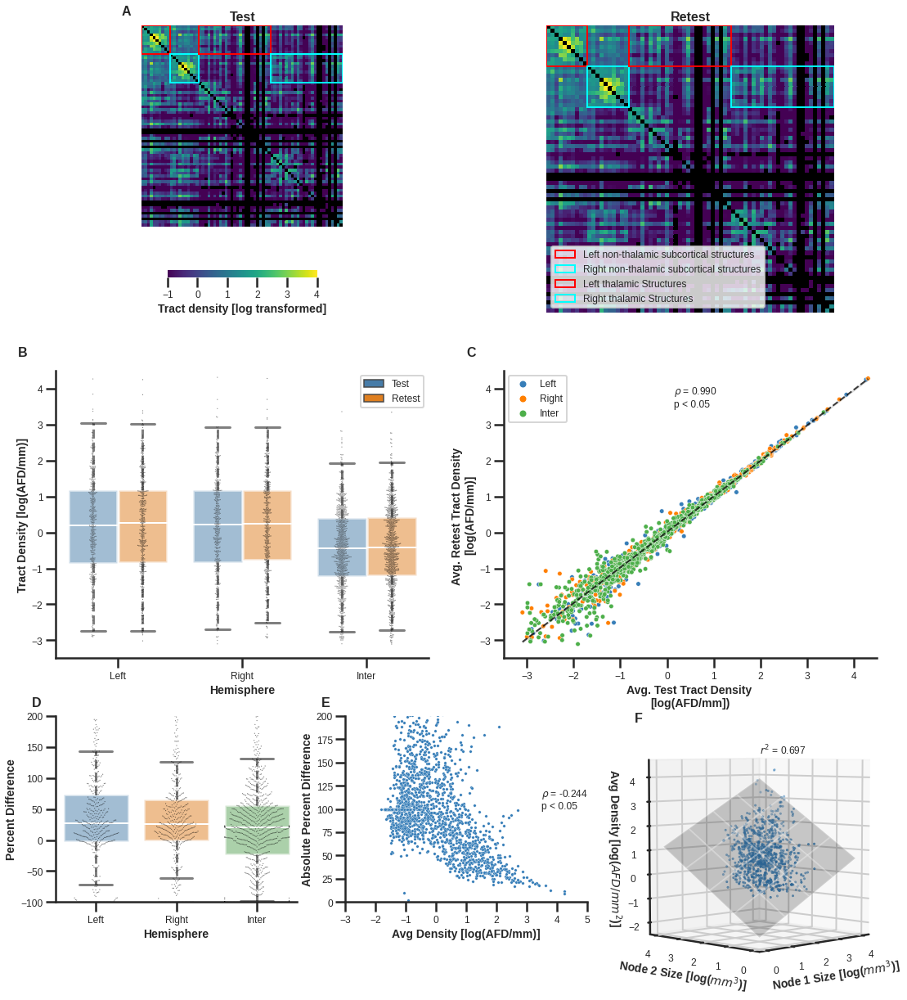

In [10]:
import matplotlib.gridspec as gridspec

%matplotlib inline

fig = plt.figure(figsize=(18, 22))

fontsize = 12
scatsize = 12
boxsize = 1.25

# Main gridspec (3 rows, 1 column)
gs_parent = gridspec.GridSpec(3, 1, figure=fig, hspace=.2)
gs_top = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs_parent[0])
ax0_left = fig.add_subplot(gs_top[0])
ax0_right = fig.add_subplot(gs_top[1])

# Setup sub gridspec
gs_mid = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs_parent[1])
ax1 = fig.add_subplot(gs_mid[1])
ax2 = fig.add_subplot(gs_mid[0])

gs_bot = gridspec.GridSpecFromSubplotSpec(3, 3, subplot_spec=gs_parent[2])
ax3 = fig.add_subplot(gs_bot[:2, 0])
ax4 = fig.add_subplot(gs_bot[:, 2], projection="3d")
ax5 = fig.add_subplot(gs_bot[:2, 1])

# Test / Retest Connectivity matrices - ax0
sns.heatmap(
    np.log10(df_test_avg_subconn),
    ax=ax0_left,
    cmap="viridis",
    vmin=-1,
    vmax=4,
    square=True,
    cbar=True,
    cbar_kws={"orientation": "horizontal", 
              "shrink": 0.4,
              "label": "Tract density [log transformed]"}
)
sns.heatmap(
    np.log10(df_test_avg_subconn),
    ax=ax0_right,
    cmap="viridis",
    vmin=-1,
    vmax=4,
    square=True,
    cbar=False,
)

# Add patches to delineate different connectivity
left_nonthal = ax0_left.add_patch(Rectangle((0, 0), 10, 10,
                    edgecolor="#ff0000",
                    facecolor="none",
                    lw=2))
right_nonthal = ax0_left.add_patch(Rectangle((10, 10), 10, 10,
                   edgecolor="#00ffff",
                   facecolor="none",
                   lw=2))
# left_thal = ax0_left.add_patch(Rectangle((20, 20), 25, 25,
#                    edgecolor="#ff8000",
#                    facecolor="none",
#                    lw=2))
left_thal = ax0_left.add_patch(Rectangle((20, 0), 25, 10,
                    edgecolor="#ff0000",
                    facecolor="none",
                    lw=2))
# right_thal = ax0_left.add_patch(Rectangle((45, 45), 25, 25,
#                    edgecolor="#00ff00",
#                    facecolor="none",
#                    lw=2))
right_thal = ax0_left.add_patch(Rectangle((45, 10), 25, 10,
                   edgecolor="#00ffff",
                   facecolor="none",
                   lw=2))
ax0_right.add_patch(Rectangle((0, 0), 10, 10,
                    edgecolor="#ff0000",
                    facecolor="none",
                    lw=2))
ax0_right.add_patch(Rectangle((10, 10), 10, 10,
                   edgecolor="#00ffff",
                   facecolor="none",
                   lw=2))
# ax0_right.add_patch(Rectangle((20, 20), 25, 25,
#                    edgecolor="#ff8000",
#                    facecolor="none",
#                    lw=2))
# ax0_right.add_patch(Rectangle((45, 45), 25, 25,
#                    edgecolor="#00ff00",
#                    facecolor="none",
#                    lw=2))
ax0_right.add_patch(Rectangle((20, 0), 25, 10,
                    edgecolor="#ff0000",
                    facecolor="none",
                    lw=2))
ax0_right.add_patch(Rectangle((45, 10), 25, 10,
                   edgecolor="#00ffff",
                   facecolor="none",
                   lw=2))


# Plot params
ax0_left.set_title("Test")
ax0_right.set_title("Retest")
ax0_left.set_yticklabels([]); ax0_left.set_yticks([])
ax0_left.set_xticklabels([]); ax0_left.set_xticks([])
ax0_right.set_yticklabels([]); ax0_right.set_yticks([])
ax0_right.set_xticklabels([]); ax0_right.set_xticks([])
ax0_right.legend([left_nonthal, right_nonthal, left_thal, right_thal], 
                 ["Left non-thalamic subcortical structures", "Right non-thalamic subcortical structures", 
                  "Left thalamic Structures", "Right thalamic Structures"])

# Test vs Retest Density - ax1
sns.scatterplot(
    data=df_test_retest, x="Test", y="Retest", hue="Hemi", ax=ax1, s=30, alpha=1
)
sns.regplot(
    data=df_test_retest,
    x="Test",
    y="Retest",
    ax=ax1,
    scatter=False,
    color="black",
    ci=95,
    line_kws={"lw": 2, "linestyle": "--", "alpha": 0.75},
    scatter_kws={"alpha": 0.5, "s": scatsize},
)
pstats = stats.spearmanr(df_test_retest["Test"], df_test_retest["Retest"], nan_policy="omit")

# Plot params
ax1.legend(fontsize=fontsize, markerscale=0.5)
# ax1.get_legend().remove()
ax1.set_xlim([-3.5, 4.5])
ax1.set_ylim([-3.5, 4.5])
ax1.spines["right"].set_visible(False)
ax1.spines["top"].set_visible(False)
ax1.set_ylabel("Avg. Retest Tract Density \n[log(AFD/mm)]")
ax1.set_xlabel("Avg. Test Tract Density \n[log(AFD/mm])")
# ax1.set_title(f"Test vs Retest Tract Density")
ax1.text(
    0.15,
    3.5,
    f"""$\\rho$ = {pstats[0]:.3f} 
p < 0.05""",
    fontsize=fontsize,
)

# Plot hemispheric tract density
df = df_test_retest.melt(
    id_vars=["Hemi"],
    value_vars=["Test", "Retest"],
    var_name="Session",
    value_name="Density",
)

sns.boxplot(
    data=df,
    x="Hemi",
    y="Density",
    hue="Session",
    ax=ax2,
    dodge=True,
    boxprops=boxprops,
    whiskerprops=whiskerprops,
    capprops=capprops,
    medianprops=medianprops,
    showfliers=False,
    whis=0.95,
)

sns.swarmplot(
    data=df,
    x="Hemi",
    y="Density",
    hue="Session",
    ax=ax2,
    color="black",
    alpha=0.5,
    dodge=True,
    size=boxsize,
)

ax2.set_ylim([-3.5, 4.5])
handles, labels = ax2.get_legend_handles_labels()
ax2.legend(handles[:2], labels[:2])
ax2.spines["right"].set_visible(False)
ax2.spines["top"].set_visible(False)

# ax2.set_title("Tract Density by Hemisphere")
ax2.set_ylabel("Tract Density [log(AFD/mm)]")
ax2.set_xlabel("Hemisphere")

del df


# Bottom row
# Plot percent change
sns.boxplot(
    data=df_diff,
    x="Hemi",
    y="Value",
    hue="Hemi",
    ax=ax3,
    dodge=False,
    boxprops=boxprops,
    whiskerprops=whiskerprops,
    capprops=capprops,
    medianprops=medianprops,
    showfliers=False,
    whis=0.95,
)
sns.swarmplot(
    data=df_diff, x="Hemi", y="Value", color="black", ax=ax3, alpha=0.5, dodge=False, size=boxsize
)

ax3.set_ylim([-100, 200])
ax3.get_legend().remove()
ax3.spines["right"].set_visible(False)
ax3.spines["top"].set_visible(False)

ax3.set_title("")
ax3.set_ylabel("Percent Difference")
ax3.set_xlabel("Hemisphere")

# 3D plot of node size vs perc diff
xx, yy = np.meshgrid(range(0, 5), range(0, 5))
zz = ols_params[0] + xx * ols_params[1] + yy * ols_params[2]

# Get values
x = df_subconn.groupby("Nodes").mean()["Node 1 Size [log]"]
y = df_subconn.groupby("Nodes").mean()["Node 2 Size [log]"]
z = df_subconn.groupby("Nodes").mean()["Avg Density [log10]"]
# Plot
ax4.view_init(5, 225)
ax4.scatter(x, y, z, c=cb_color_cycle[0], s=1)
ax4.plot_surface(xx, yy, zz, alpha=0.2, edgecolor=None, color="black")
ax4.get_proj = lambda: np.dot(Axes3D.get_proj(ax4), np.diag([1., 1., 1.5, 1.]))
# Labels
ax4.set_xlabel("Node 1 Size [log($mm^3$)]")
ax4.set_ylabel("Node 2 Size [log($mm^3$)]")
ax4.set_zlabel("Avg Density [log($AFD/mm^2$)]")
ax4.text(0, 0, 5, f"$r^2$ = {results.rsquared_adj:.3f}", fontsize=fontsize)

# Abs perc vs avg density
df = df_subconn.copy()
df["Percent Change"] = np.abs(df["Percent Change"])
df.replace({np.inf: np.nan, -np.inf: np.nan}, inplace=True)

sns.scatterplot(
    x="Avg Density [log10]",
    y="Percent Change",
    data=df.groupby("Nodes").mean(),
    ax=ax5,
    s=scatsize,
)
rho, p = stats.spearmanr(
    df.dropna()["Avg Density [log10]"], df.dropna()["Percent Change"]
)
ax5.set_xlim([-3, 5])
ax5.set_ylim([0, 200])
ax5.set_xlabel("Avg Density [log(AFD/mm)]")
ax5.set_ylabel("Absolute Percent Difference")
ax5.text(
    3.5,
    100,
    f"""$\\rho$ = {rho:.3f}
p < 0.05""",
    fontsize=fontsize,
)
ax5.spines["right"].set_visible(False)
ax5.spines["top"].set_visible(False)

# Add panel labels
axes = [ax0_left, ax2, ax1, ax3, ax5, ax4]
for ix, ax in enumerate(axes):
    if ix != 5:
        ax.text(-0.1, 1.05, s=chr(ord("@")+ix+1), fontsize=16, fontweight="bold", transform=ax.transAxes)
    else:
        ax.text(-0.1, 0, 50, s=chr(ord('@')+ix+1), fontsize=16, fontweight="bold", transform=ax.transAxes)

del df

filename = f"{figure_dir}/fig2_varying_test.svg"
plt.savefig(filename, dpi=300, bbox_inches="tight", facecolor="white")

plt.show()
plt.close()

#### Figure 3

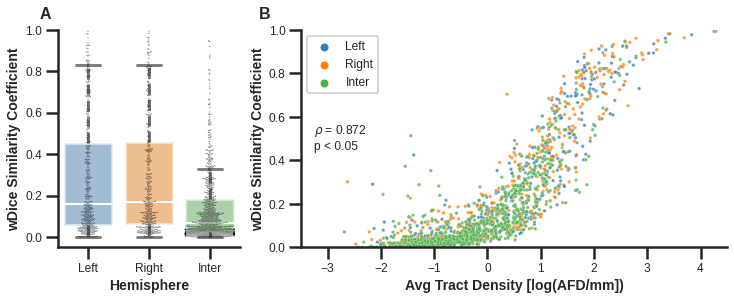

In [47]:
import matplotlib.gridspec as gridspec

%matplotlib inline

fig = plt.figure(figsize=(12, 4))

fontsize = 12
scatsize = 12
panelsize = 16
boxsize = 1.25

# Main gridspec (1 row(s), 3 column(s))
gs_parent = gridspec.GridSpec(1, 2, figure=fig, width_ratios=[3, 7])
ax1 = fig.add_subplot(gs_parent[0])
ax2 = fig.add_subplot(gs_parent[1])

# ax1 - Hemispheric wDSC
sns.boxplot(
    data=df_dsc_diff,
    x="Hemi",
    y="Value",
    hue="Hemi",
    ax=ax1,
    dodge=False,
    boxprops=boxprops,
    whiskerprops=whiskerprops,
    capprops=capprops,
    medianprops=medianprops,
    showfliers=False,
    whis=0.95,
)
sns.swarmplot(
    data=df_dsc_diff,
    x="Hemi",
    y="Value",
    ax=ax1,
    color="black",
    alpha=0.5,
    dodge=False,
    size=1.25,
)

ax1.set_ylim([-0.05, 1])
ax1.get_legend().remove()
ax1.spines["right"].set_visible(False)
ax1.spines["top"].set_visible(False)
# ax1.set_title("Tract Volume Overlap")
ax1.set_ylabel("wDice Similarity Coefficient")
ax1.set_xlabel("Hemisphere")


# ax2 - wDSC vs Avg Density
df = df_test_retest
sns.scatterplot(data=df, x="Avg", y="dsc", hue="Hemi", ax=ax2, s=scatsize, alpha=.75)

# Test for normality
stats_sym = "$\\rho$"
pstats = stats.spearmanr(df["Avg"], df["dsc"], nan_policy="omit")

# Legend parms
ax2.legend(fontsize=fontsize, markerscale=0.5, loc="upper left")

# Plot params
ax2.text(
    -3.25,
    0.45,
    f"""{stats_sym} = {pstats[0]:.3f}
p < 0.05""",
    fontsize=12,
)
ax2.set_xlim([-3.5, 4.5])
ax2.set_ylim([0, 1])
ax2.spines["right"].set_visible(False)
ax2.spines["top"].set_visible(False)

ax2.set_xlabel("Avg Tract Density [log(AFD/mm])")
ax2.set_ylabel("wDice Similarity Coefficient")
# ax2.set_yticklabels([])
# ax2.set_title("Overlap - Tract Density Relationship")

# Plot panel labels
for ix, ax in enumerate([ax1, ax2]):
    ax.text(-0.1, 1.05, s=chr(ord("@")+ix+1), fontsize=16, fontweight="bold", transform=ax.transAxes)

# Save figure
plt.savefig(f"{figure_dir}/fig3.svg", dpi=300, bbox_inches="tight", facecolor="white")

plt.show()
plt.close()

#### Figure 4
##### Motor circuit

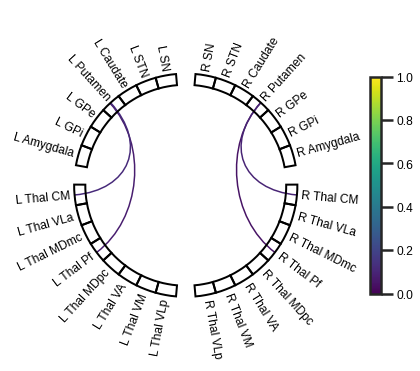

In [144]:
fig = plt.figure(figsize=(8, 8))

node_angles = circular_layout(final_node_names, final_node_names, start_pos=90,
                              group_boundaries=[0, 7, len(final_node_names) / 2, len(final_node_names) / 2 + 8])

plot_chord(motor_mat_dsc, final_node_names,
           node_angles=node_angles,
           fig=fig, colorbar_pos=(-0.3, 0.5), 
           colorbar_size=.5, 
           fontsize_colorbar=12, 
           fontsize_names=12, 
           colormap="viridis",
           vmin=0, vmax=1, 
           facecolor="white", 
           textcolor="black",
           node_colors=[(0,0,0,0)],
           linewidth=1.5)

# fig.savefig(f"{figure_dir}/motor_circuit_dsc.svg", dpi=300, bbox_inches="tight")

plt.show()
plt.close()

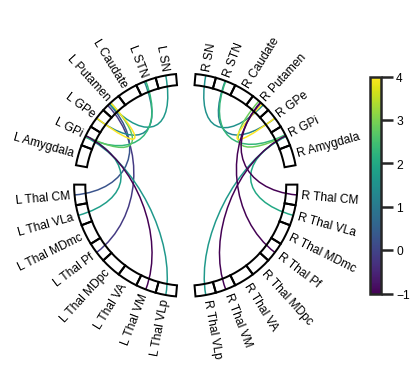

In [129]:
fig = plt.figure(figsize=(8, 8))

node_angles = circular_layout(final_node_names, final_node_names, start_pos=90,
                              group_boundaries=[0, 7, len(final_node_names) / 2, len(final_node_names) / 2 + 8])

plot_chord(motor_mat_test, final_node_names,
           node_angles=node_angles,
           fig=fig, colorbar_pos=(-0.3, 0.5), 
           colorbar_size=.5, 
           fontsize_colorbar=12, 
           fontsize_names=12, 
           colormap="viridis",
           vmin=-1, vmax=4, 
           facecolor="white", 
           textcolor="black",
           node_colors=[(0,0,0,0)],
           linewidth=1.5)

fig.savefig(f"{figure_dir}/motor_circuit_test.svg", dpi=300, bbox_inches="tight")

plt.show()
plt.close()

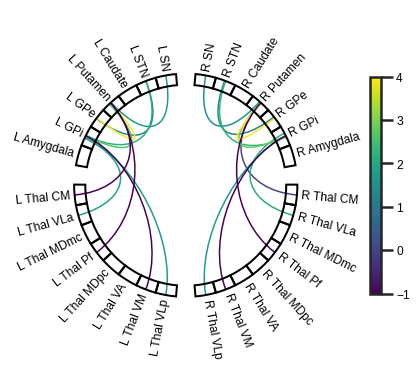

In [16]:
fig = plt.figure(figsize=(8, 8))

node_angles = circular_layout(final_node_names, final_node_names, start_pos=90,
                              group_boundaries=[0, 7, len(final_node_names) / 2, len(final_node_names) / 2 + 8])

plot_chord(motor_mat_retest, final_node_names,
           node_angles=node_angles,
           fig=fig, colorbar_pos=(-0.3, 0.5), 
           colorbar_size=.5, 
           fontsize_colorbar=12, 
           fontsize_names=12, 
           colormap="viridis",
           vmin=-1, vmax=4, 
           facecolor="white", 
           textcolor="black",
           node_colors=[(0,0,0,0)],
           linewidth=1.5)

fig.savefig(f"{figure_dir}/motor_circuit_retest.svg", dpi=300, bbox_inches="tight")

plt.show()
plt.close()

##### Associative circuit

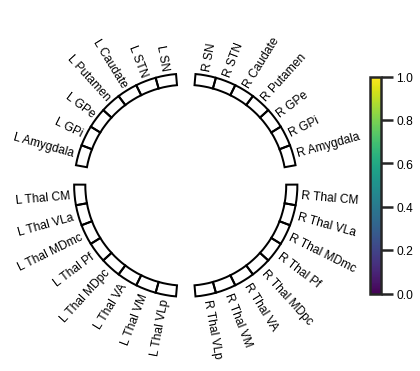

In [145]:
fig = plt.figure(figsize=(8, 8))

node_angles = circular_layout(final_node_names, final_node_names, start_pos=90,
                              group_boundaries=[0, 7, len(final_node_names) / 2, len(final_node_names) / 2 + 8])

plot_chord(assoc_mat_dsc, final_node_names,
           node_angles=node_angles,
           fig=fig, colorbar_pos=(-0.3, 0.5), 
           colorbar_size=.5, 
           fontsize_colorbar=12, 
           fontsize_names=12, 
           colormap="viridis",
           vmin=0, vmax=1, 
           facecolor="white", 
           textcolor="black",
           node_colors=[(0,0,0,0)],
           linewidth=1.5)

# fig.savefig(f"{figure_dir}/associative_circuit_dsc.svg", dpi=300, bbox_inches="tight")

plt.show()
plt.close()

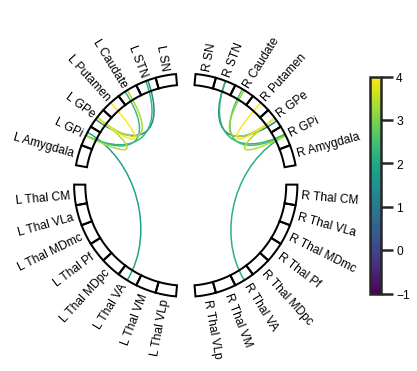

In [23]:
fig = plt.figure(figsize=(8, 8))

node_angles = circular_layout(final_node_names, final_node_names, start_pos=90,
                              group_boundaries=[0, 7, len(final_node_names) / 2, len(final_node_names) / 2 + 8])

plot_chord(assoc_mat_test, final_node_names,
           node_angles=node_angles,
           fig=fig, colorbar_pos=(-0.3, 0.5), 
           colorbar_size=.5, 
           fontsize_colorbar=12, 
           fontsize_names=12, 
           colormap="viridis",
           vmin=-1, vmax=4, 
           facecolor="white", 
           textcolor="black",
           node_colors=[(0,0,0,0)],
           linewidth=1.5)

fig.savefig(f"{figure_dir}/associative_circuit_test.svg", dpi=300, bbox_inches="tight")

plt.show()
plt.close()

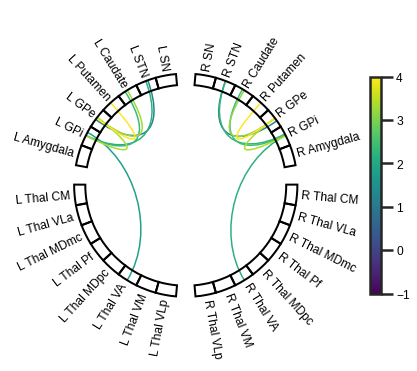

In [24]:
fig = plt.figure(figsize=(8, 8))

node_angles = circular_layout(final_node_names, final_node_names, start_pos=90,
                              group_boundaries=[0, 7, len(final_node_names) / 2, len(final_node_names) / 2 + 8])

plot_chord(assoc_mat_retest, final_node_names,
           node_angles=node_angles,
           fig=fig, colorbar_pos=(-0.3, 0.5), 
           colorbar_size=.5, 
           fontsize_colorbar=12, 
           fontsize_names=12, 
           colormap="viridis",
           vmin=-1, vmax=4, 
           facecolor="white", 
           textcolor="black",
           node_colors=[(0,0,0,0)],
           linewidth=1.5)

fig.savefig(f"{figure_dir}/associative_circuit_retest.svg", dpi=300, bbox_inches="tight")

plt.show()
plt.close()

##### Limbic Circuit

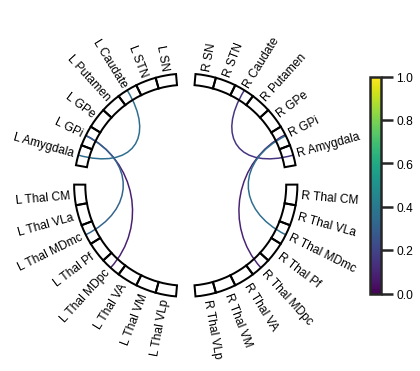

In [146]:
fig = plt.figure(figsize=(8, 8))

node_angles = circular_layout(final_node_names, final_node_names, start_pos=90,
                              group_boundaries=[0, 7, len(final_node_names) / 2, len(final_node_names) / 2 + 8])

plot_chord(limbic_mat_dsc, final_node_names,
           node_angles=node_angles,
           fig=fig, colorbar_pos=(-0.3, 0.5), 
           colorbar_size=.5, 
           fontsize_colorbar=12, 
           fontsize_names=12, 
           colormap="viridis",
           vmin=0, vmax=1, 
           facecolor="white", 
           textcolor="black",
           node_colors=[(0,0,0,0)],
           linewidth=1.5)

# fig.savefig(f"{figure_dir}/limbic_circuit_dsc.svg", dpi=300, bbox_inches="tight")

plt.show()
plt.close()

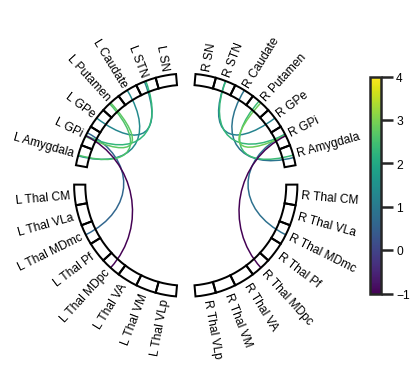

In [26]:
fig = plt.figure(figsize=(8, 8))

node_angles = circular_layout(final_node_names, final_node_names, start_pos=90,
                              group_boundaries=[0, 7, len(final_node_names) / 2, len(final_node_names) / 2 + 8])

plot_chord(limbic_mat_test, final_node_names,
           node_angles=node_angles,
           fig=fig, colorbar_pos=(-0.3, 0.5), 
           colorbar_size=.5, 
           fontsize_colorbar=12, 
           fontsize_names=12, 
           colormap="viridis",
           vmin=-1, vmax=4, 
           facecolor="white", 
           textcolor="black",
           node_colors=[(0,0,0,0)],
           linewidth=1.5)

fig.savefig(f"{figure_dir}/limbic_circuit_test.svg", dpi=300, bbox_inches="tight")

plt.show()
plt.close()

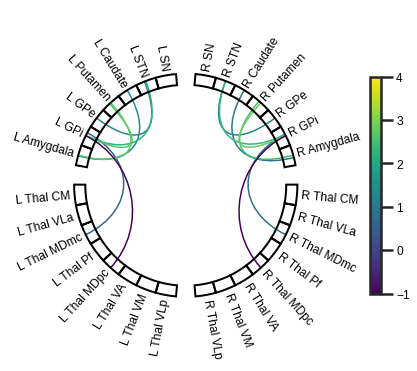

In [27]:
fig = plt.figure(figsize=(8, 8))

node_angles = circular_layout(final_node_names, final_node_names, start_pos=90,
                              group_boundaries=[0, 7, len(final_node_names) / 2, len(final_node_names) / 2 + 8])

plot_chord(limbic_mat_retest, final_node_names,
           node_angles=node_angles,
           fig=fig, colorbar_pos=(-0.3, 0.5), 
           colorbar_size=.5, 
           fontsize_colorbar=12, 
           fontsize_names=12, 
           colormap="viridis",
           vmin=-1, vmax=4, 
           facecolor="white", 
           textcolor="black",
           node_colors=[(0,0,0,0)],
           linewidth=1.5)

fig.savefig(f"{figure_dir}/limbic_circuit_retest.svg", dpi=300, bbox_inches="tight")

plt.show()
plt.close()

## In-depth subcortical nodes <a class="anchor" id="subconn_detail"></a>

* Iterate over subjects and compute regression + corrected p-vals (fdr)
* Create function to plot regression (wDSC vs avg density) + corrected p-vals

In [30]:
df_subconn = dict()
df_subconn["Subject"] = []
df_subconn["Hemi"] = []
df_subconn["Nodes"] = []
df_subconn["HCPUR Density"] = []
df_subconn["HCPUR Density [log10]"] = []

# Compute for nodes
for idx, (node1, node2) in enumerate(
    tqdm(list(itertools.combinations(parcellation_map["Label"].tolist(), 2)))
):
    nodes = f"{node1}-{node2}"
    # Check for hemi
    if check_hemi(node1) == check_hemi(node2) == "Even":
        hemi = "R"
    elif check_hemi(node1) == check_hemi(node2) == "Odd":
        hemi = "L"
    else:
        hemi = "Inter"

    for s, subj in enumerate(demographics_df["Subject"].tolist()):
        df_subconn["Subject"].append(subj)
        df_subconn["Hemi"].append(hemi)
        df_subconn["Nodes"].append(nodes)

        # Test
        df_hcpur_subj = pd.DataFrame(hcpur_conn_mat[:, :, s])
        hcpur_density = df_hcpur_subj.loc[node1 - 1, node2 - 1]
        df_subconn["HCPUR Density"].append(hcpur_density)
        df_subconn["HCPUR Density [log10]"].append(
            np.log10(df_subconn["HCPUR Density"][-1])
        )

        del (
            df_hcpur_subj,
        )

    clear_output(wait=True)

df_subconn = pd.DataFrame(df_subconn)

# handle_session(save=True)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 435/435 [00:05<00:00, 75.29it/s]


In [8]:
# Test intersession
df_subconn_intersession = dict()
df_subconn_intersession["Hemi"] = []
df_subconn_intersession["Nodes"] = []
df_subconn_intersession["t-stat"] = []
df_subconn_intersession["t-pval"] = []
df_subconn_intersession["t-pval (fdr)"] = []
df_subconn_intersession["Density r"] = []
df_subconn_intersession["Density pval"] = []
df_subconn_intersession["Density pval (fdr)"] = []
df_subconn_intersession["wDSC r"] = []
df_subconn_intersession["wDSC pval"] = []
df_subconn_intersession["wDSC pval (fdr)"] = []

for nodes in tqdm(np.unique(df_subconn["Nodes"].tolist())):
    t, t_p = stats.ttest_rel(
        df_subconn[df_subconn["Nodes"] == nodes]["Test Density"],
        df_subconn[df_subconn["Nodes"] == nodes]["Retest Density"],
        nan_policy="omit",
    )
    df_subconn_intersession["Hemi"].append(
        df_subconn[df_subconn["Nodes"] == nodes]["Hemi"].tolist()[0]
    )
    df_subconn_intersession["Nodes"].append(nodes)
    df_subconn_intersession["t-stat"].append(t)
    df_subconn_intersession["t-pval"].append(t_p)

    # Test vs retest regression
    lr, lr_p = stats.spearmanr(
        df_subconn[df_subconn["Nodes"] == nodes]["Test Density"],
        df_subconn[df_subconn["Nodes"] == nodes]["Retest Density"],
    )
    df_subconn_intersession["Density r"].append(lr)
    df_subconn_intersession["Density pval"].append(lr_p)

    # Avg density vs overlap correlation
    try:
        wr, wr_p = stats.spearmanr(
            df_subconn[df_subconn["Nodes"] == nodes]["Avg Density"],
            df_subconn[df_subconn["Nodes"] == nodes]["Tract Overlap (wDSC)"],
        )
        df_subconn_intersession["wDSC r"].append(wr)
        df_subconn_intersession["wDSC pval"].append(wr_p)
    except:
        df_subconn_intersession["wDSC r"].append(np.nan)
        df_subconn_intersession["wDSC pval"].append(np.nan)


# FDR correction
nan_idx = np.argwhere(np.isnan(df_subconn_intersession["t-pval"]))
uncor_pval = np.delete(df_subconn_intersession["t-pval"], nan_idx)
_, cor_pval = fdrcorrection(uncor_pval)
for idx in nan_idx:
    cor_pval = np.insert(cor_pval, idx, np.nan)
df_subconn_intersession["t-pval (fdr)"].extend(cor_pval)

nan_idx = np.argwhere(np.isnan(df_subconn_intersession["Density pval"]))
uncor_pval = np.delete(df_subconn_intersession["Density pval"], nan_idx)
_, cor_pval = fdrcorrection(uncor_pval)
for idx in nan_idx:
    cor_pval = np.insert(cor_pval, idx, np.nan)
df_subconn_intersession["Density pval (fdr)"].extend(cor_pval)

nan_idx = np.argwhere(np.isnan(df_subconn_intersession["wDSC pval"]))
uncor_pval = np.delete(df_subconn_intersession["wDSC pval"], nan_idx)
_, cor_pval = fdrcorrection(uncor_pval)
for idx in nan_idx:
    cor_pval = np.insert(cor_pval, idx, np.nan)
df_subconn_intersession["wDSC pval (fdr)"].extend(cor_pval)

df_subconn_intersession = pd.DataFrame(df_subconn_intersession)

handle_session(save=True)

  2%|▏         | 45/2415 [00:01<01:28, 26.66it/s]/home/ROBARTS/tkai/khan/users/tkai/opt/venv/.jupytervenv/lib/python3.7/site-packages/numpy/lib/function_base.py:2559: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
  5%|▍         | 114/2415 [00:04<01:31, 25.27it/s]/home/ROBARTS/tkai/khan/users/tkai/opt/venv/.jupytervenv/lib/python3.7/site-packages/numpy/lib/function_base.py:2560: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
100%|██████████| 2415/2415 [01:33<00:00, 25.82it/s]


Saving notebook session


In [9]:
# Test rh vs lh - intrasession
df_subconn_intrasession = dict()
df_subconn_intrasession["Nodes"] = []
df_subconn_intrasession["t-stat [Test]"] = []
df_subconn_intrasession["t-pval [Test]"] = []
df_subconn_intrasession["t-pval (fdr) [Test]"] = []
df_subconn_intrasession["t-stat [Retest]"] = []
df_subconn_intrasession["t-pval [Retest]"] = []
df_subconn_intrasession["t-pval (fdr) [Retest]"] = []

tested_nodes = []
for (
    node1,
    node2,
) in tqdm(list(itertools.combinations(parcellation_map["Label"].tolist(), 2))):
    # Ignore interhemispheric connectivity
    if check_hemi(node1) != check_hemi(node2):
        continue

    if check_hemi(node1) == check_hemi(node2) == "even":
        continue

    nodes = f"{node1}-{node2}"
    opp_nodes = f"{node1 + 1}-{node2 + 1}"

    t, p = stats.ttest_ind(
        df_subconn[df_subconn["Nodes"] == nodes]["Test Density"],
        df_subconn[df_subconn["Nodes"] == opp_nodes]["Test Density"],
        nan_policy="omit",
        equal_var=False,
    )
    df_subconn_intrasession["Nodes"].append(nodes)
    df_subconn_intrasession["t-stat [Test]"].append(t)
    df_subconn_intrasession["t-pval [Test]"].append(p)

    t, p = stats.ttest_ind(
        df_subconn[df_subconn["Nodes"] == nodes]["Retest Density"],
        df_subconn[df_subconn["Nodes"] == opp_nodes]["Retest Density"],
        nan_policy="omit",
        equal_var=False,
    )
    df_subconn_intrasession["t-stat [Retest]"].append(t)
    df_subconn_intrasession["t-pval [Retest]"].append(p)

## FDR correction
uncor_pval = [
    df_subconn_intrasession["t-pval [Test]"],
    df_subconn_intrasession["t-pval [Retest]"],
]
uncor_pval = list(itertools.chain(*uncor_pval))
nan_idx = np.argwhere(np.isnan(uncor_pval))
uncor_pval = np.delete(uncor_pval, nan_idx)
_, cor_pval = fdrcorrection(uncor_pval)
for idx in nan_idx:
    cor_pval = np.insert(cor_pval, idx, np.nan)

df_subconn_intrasession["t-pval (fdr) [Test]"].extend(
    cor_pval[: len(df_subconn_intrasession["t-stat [Test]"])]
)
df_subconn_intrasession["t-pval (fdr) [Retest]"].extend(
    cor_pval[len(df_subconn_intrasession["t-stat [Test]"]) :]
)

df_subconn_intrasession = pd.DataFrame(df_subconn_intrasession)

handle_session(save=True)

100%|██████████| 2415/2415 [00:24<00:00, 98.28it/s] 


Saving notebook session


In [10]:
df_subconn2 = pd.DataFrame(
    columns=["Subject", "Dataset", "Nodes", "Hemi", "Density", "Density [log]"]
)

for idx, row in tqdm(df_subconn.iterrows()):
    test_data = {
        "Subject": df_subconn.loc[idx, "Subject"],
        "Dataset": "Test",
        "Nodes": df_subconn.loc[idx, "Nodes"],
        "Hemi": df_subconn.loc[idx, "Hemi"],
        "Density": df_subconn.loc[idx, "Test Density"],
        "Density [log]": df_subconn.loc[idx, "Test Density [log10]"],
    }

    retest_data = {
        "Subject": df_subconn.loc[idx, "Subject"],
        "Dataset": "Retest",
        "Nodes": df_subconn.loc[idx, "Nodes"],
        "Hemi": df_subconn.loc[idx, "Hemi"],
        "Density": df_subconn.loc[idx, "Retest Density"],
        "Density [log]": df_subconn.loc[idx, "Retest Density [log10]"],
    }

    df_subconn2 = df_subconn2.append(test_data, ignore_index=True)
    df_subconn2 = df_subconn2.append(retest_data, ignore_index=True)

del test_data, retest_data
handle_session(save=True)

89355it [25:44, 57.87it/s] 


Saving notebook session


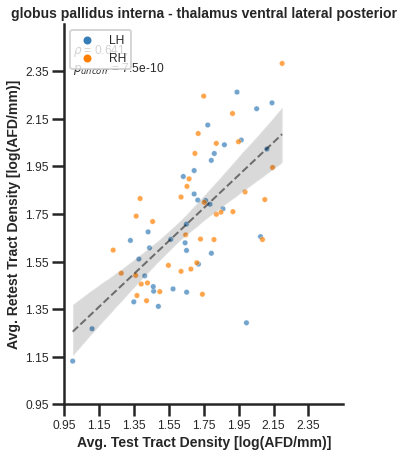

In [136]:
plot_subconn_density_scatter(df_subconn, 13, 69, lims=[0.95, 2.55])

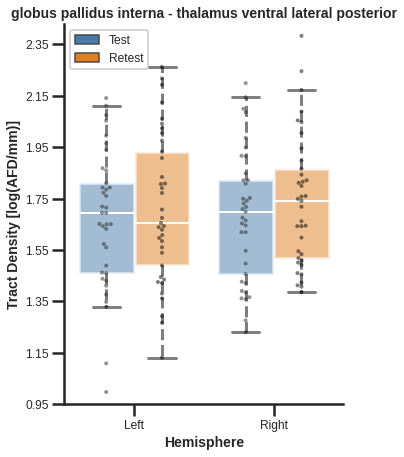

In [132]:
plot_subconn_density_box(df_subconn2, 13, 69)

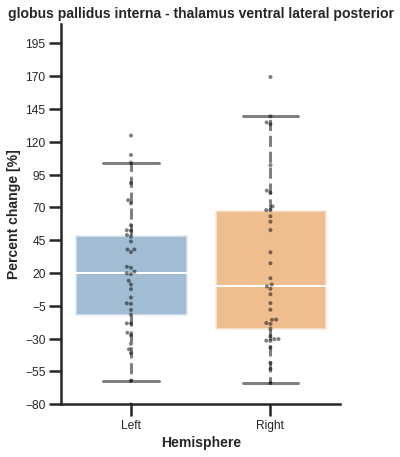

In [123]:
plot_subconn_density_change(df_subconn, 13, 69)

/home/ROBARTS/tkai/khan/users/tkai/opt/venv/.jupytervenv/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.


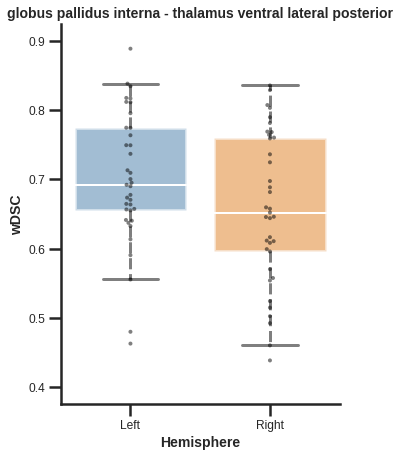

In [124]:
plot_subconn_overlap(df_subconn, 13, 69)

/home/ROBARTS/tkai/khan/users/tkai/opt/venv/.jupytervenv/lib/python3.7/site-packages/ipykernel_launcher.py:80: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.


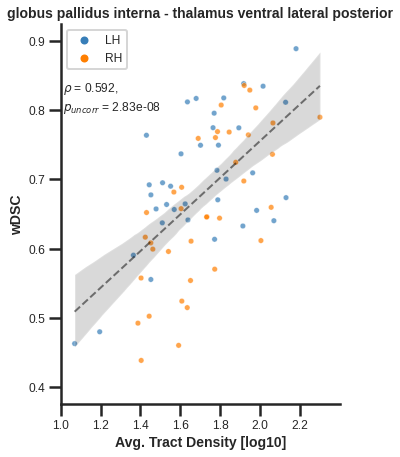

In [28]:
plot_subconn_relationship(df_subconn, 13, 69)

In [105]:
connectivity_summary(13, 69, df_subconn=df_subconn)

Average values for 13-69:
    Test Density 		55.34001265244709
    Retest Density 		63.47388050443417
    Percent Change 		20.635551479377263
    Tract Overlap 		0.7010925468560811

Average values for 14-70:
    Test Density 		56.94616177199862
    Retest Density 		65.88949385552189
    Percent Change 		29.62425851188824
    Tract Overlap 		0.6583907016225763

Intersession tract density (test vs retest): 
    t-stat 			-1.3831420523913631
    Corrected p-val 		0.7679645067025241

Intrasession tract density (lh vs rh):
    Test t-stat 		-0.20521351040512475
    Test corrected p-val 	0.8768005683406204
    Retest t-stat 		-0.2295934345942772
    Retest corrected p-val 	0.861806880243207


In [6]:
viz_tract?

Signature:
viz_tract(
    subjid,
    node1=13,
    node2=69,
    roi=None,
    perc=None,
    hemi='L',
    retest=False,
    interactive=False,
    opacity=0.5,
    size=(600, 600),
)
Docstring:
Visualize tract using `fury`.
By default, only show the tract from the test dataset

Eg. Interactive visualization of ansa, passing through 'fl' roi, thresholded at 25th percentile of CCI
viz_tract('sub-103818', 13, 69, roi='fl', perc=25, retest=True, interactive=True)

INPUTS:
    subjid - ID of subject to visualize
    node1 - terminal node for tract
    node2 - other terminal node for trat
    roi - region used to mask tractography
    perc - percentile to visualize (25, 50, or 75)
    hemi - hemisphere the tract is in
    retest - overlay retest tractography
    interactive - interactive visualization
    opacity - opacity of tractography
    size - figure window dimensions
File:      ~/graham/scratch/Zona2/notebooks/hcp1200_3T/<ipython-input-131-a8f2a469c48a>
Type:      function


In [17]:
viz_tract("sub-103818", 13, 69, hemi='L', roi='fl', interactive=True)

## Ansa Lenticularis (via `ft`) <a class="anchor" id="ansa_ft"></a>
_NOTE: THESE ARE CURRENTLY STATIC AND NEED TO BE REGENERATED_

* Left - Node 13 (GPi) to Node 69 (VPl)
* Right - Node 14 (GPi) to Node 70 (VPl)

In [16]:
handle_session()

Loading notebook session


In [43]:
df_ansa = pd.DataFrame(columns=["Subject", "Hemi"])

for subjIdx, subj in enumerate(subjlist.values.tolist()):
    subj = subj[0]
    for hemi in ["L", "R"]:
        data = {"Subject": subj, "Hemi": hemi}
        df_ansa = df_ansa.append(data, ignore_index=True)

In [45]:
# Tract densities
for idx, subj in tqdm(df_ansa.iterrows()):
    subj = subj[0]

    # Get hemisphere
    hemi = df_ansa.loc[idx, "Hemi"]

    if hemi == "L":
        nodes = "13-69"
    else:
        nodes = "14-70"

    for perc in [25, 50, 75]:
        # Test dataset
        test_csv = f"{test_dir}/derivatives/mrtpipelines_0.1.6/mrtpipelines/{subj}/tractography/cleaned/{subj}_space-dwi_hemi-{hemi}_desc-ft_tckweight{nodes}_{perc}.csv"
        test_density = pd.read_csv(test_csv, header=None, sep=" ")
        df_ansa.at[idx, f"Test Density ({perc}th percentile)"] = np.float(
            test_density.sum(axis=1)
        )

        # Retest
        retest_csv = f"{retest_dir}/derivatives/mrtpipelines_0.1.6/mrtpipelines/{subj}/tractography/cleaned/{subj}_space-dwi_hemi-{hemi}_desc-ft_tckweight{nodes}_{perc}.csv"
        retest_density = pd.read_csv(retest_csv, header=None, sep=" ")
        df_ansa.at[idx, f"Retest Density ({perc}th percentile)"] = np.float(
            retest_density.sum(axis=1)
        )

86it [00:58,  1.46it/s]


In [48]:
for dflag, dataset in enumerate(tqdm([test_dir, retest_dir])):
    for idx, subj in df_ansa.iterrows():
        subj = subj[0]
        for hemi in ["L", "R"]:
            if hemi == "L":
                nodes = "13-69"
            else:
                nodes = "14-70"
            csv_file = f"{dataset}/derivatives/mrtpipelines_0.1.6/mrtpipelines/{subj}/tractography/filtered/{subj}_space-dwi_hemi-{hemi}_desc-ft_tckweights{nodes}_mean.csv"

            # Add tract density to dataframe
            if dflag == 0:
                col_label = f"{hemi} Test Density"
            else:
                col_label = f"{hemi} Retest Density"

            try:
                tckweight = pd.read_csv(csv_file, header=None, sep=" ")
                tckweight = tckweight.sum(axis=1)
                df_ansa.at[idx, col_label] = np.log10(tckweight.values)
            except:
                df_ansa.at[idx, col_label] = np.nan

100%|██████████| 2/2 [00:02<00:00,  1.25s/it]


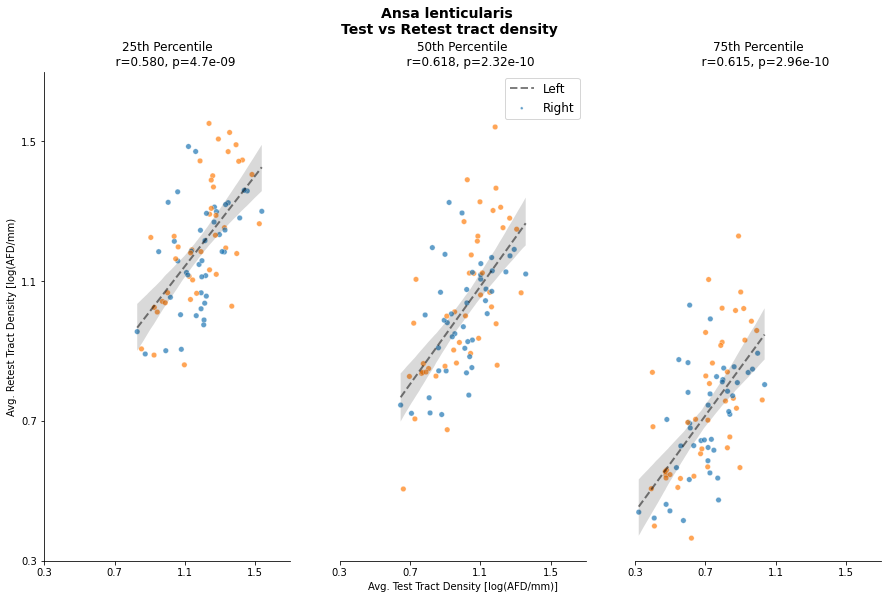

In [68]:
# Plot individual stats
%matplotlib inline

f, ax = plt.subplots(1, 3, figsize=(15, 9))

for i, perc in enumerate([25, 50, 75]):
    df_ansa[f"Test Density ({perc}th percentile) [log10]"] = np.log10(
        df_ansa[f"Test Density ({perc}th percentile)"]
    )
    df_ansa[f"Retest Density ({perc}th percentile) [log10]"] = np.log10(
        df_ansa[f"Retest Density ({perc}th percentile)"]
    )

    sns.scatterplot(
        data=df_ansa,
        x=f"Test Density ({perc}th percentile) [log10]",
        y=f"Retest Density ({perc}th percentile) [log10]",
        hue="Hemi",
        ax=ax[i],
        s=30,
        alpha=0.7,
    )
    sns.regplot(
        data=df_ansa,
        x=f"Test Density ({perc}th percentile) [log10]",
        y=f"Retest Density ({perc}th percentile) [log10]",
        ax=ax[i],
        scatter=False,
        color="black",
        ci=95,
        line_kws={"lw": 2, "linestyle": "--", "alpha": 0.5},
    )

    pstats = stats.pearsonr(
        df_ansa[f"Test Density ({perc}th percentile) [log10]"],
        df_ansa[f"Retest Density ({perc}th percentile) [log10]"],
    )

    # Plot params
    ax[i].set_xlim([0.3, 1.7])
    ax[i].set_xticks(np.arange(0.3, 1.8, 0.4))
    ax[i].set_ylim([0.3, 1.7])
    ax[i].spines["right"].set_visible(False)
    ax[i].spines["top"].set_visible(False)
    ax[i].set_title(
        f"""{perc}th Percentile
    r={pstats[0]:.3f}, p={pstats[1]:.3g}"""
    )

    if i == 1:
        ax[i].legend(["Left", "Right"], fontsize=12, markerscale=0.5)
        ax[i].set_xlabel("Avg. Test Tract Density [log(AFD/mm)]")
    else:
        ax[i].get_legend().remove()
        ax[i].set_xlabel("")
        ax[i].set_ylabel("Avg. Retest Tract Density [log(AFD/mm)")
        ax[i].set_yticks(np.arange(0.3, 1.8, 0.4))

    if i != 0:
        ax[i].spines["left"].set_visible(False)
        ax[i].set_yticklabels("")
        ax[i].set_yticks([])
        ax[i].set_ylabel("")

f.suptitle(
    "Ansa lenticularis \nTest vs Retest tract density", fontsize=14, fontweight="bold"
)

filename = "{0}/ansa_scatter.png".format(figure_dir)
# plt.savefig(filename, dpi=300, bbox_inches="tight", facecolor="white")

plt.show()
plt.close()

In [61]:
df_ansa2 = pd.DataFrame(
    columns=[
        "Subject",
        "Dataset",
        "Hemi",
        "Density (25)",
        "Density (50)",
        "Density (75)",
    ]
)

for idx, subj in df_ansa.iterrows():
    subj = subj[0]
    hemi = df_ansa.loc[idx, "Hemi"]

    # Get hemisphere
    if hemi == "L":
        nodes = "13-69"
    else:
        nodes = "14-70"

    test_25 = df_ansa.loc[idx, f"Test Density (25th percentile)"]
    test_50 = df_ansa.loc[idx, f"Test Density (50th percentile)"]
    test_75 = df_ansa.loc[idx, f"Test Density (75th percentile)"]

    retest_25 = df_ansa.loc[idx, f"Retest Density (25th percentile)"]
    retest_50 = df_ansa.loc[idx, f"Retest Density (50th percentile)"]
    retest_75 = df_ansa.loc[idx, f"Retest Density (75th percentile)"]

    test_data = {
        "Subject": subj,
        "Dataset": "Test",
        "Hemi": hemi,
        "Density (25)": test_25,
        "Density (50)": test_50,
        "Density (75)": test_75,
        "Density (25) [log]": np.log10(test_25),
        "Density (50) [log]": np.log10(test_50),
        "Density (75) [log]": np.log10(test_75),
    }

    retest_data = {
        "Subject": subj,
        "Dataset": "Retest",
        "Hemi": hemi,
        "Density (25)": retest_25,
        "Density (50)": retest_50,
        "Density (75)": retest_75,
        "Density (25) [log]": np.log10(retest_25),
        "Density (50) [log]": np.log10(retest_50),
        "Density (75) [log]": np.log10(retest_75),
    }

    df_ansa2 = df_ansa2.append(test_data, ignore_index=True)
    df_ansa2 = df_ansa2.append(retest_data, ignore_index=True)

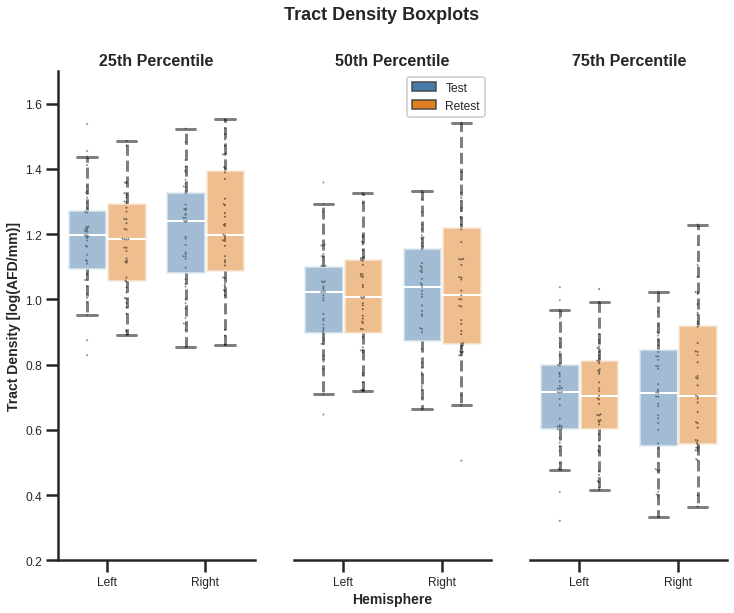

In [65]:
# Plot hemispheric differences
%matplotlib inline

fig, ax = plt.subplots(1, 3, figsize=(12, 9))

for i, perc in enumerate([25, 50, 75]):
    sns.boxplot(
        data=df_ansa2,
        x="Hemi",
        y=f"Density ({perc}) [log]",
        hue="Dataset",
        dodge=True,
        ax=ax[i],
        boxprops=boxprops,
        whiskerprops=whiskerprops,
        capprops=capprops,
        medianprops=medianprops,
        showfliers=False,
        whis=0.95,
    )
    sns.swarmplot(
        data=df_ansa2,
        x="Hemi",
        y=f"Density ({perc}) [log]",
        hue="Dataset",
        ax=ax[i],
        color="black",
        alpha=0.5,
        dodge=True,
        size=2,
    )

    # T-test
    uncor_pval = []
    tstat, pval = stats.ttest_rel(
        df_ansa[df_ansa["Hemi"] == "L"][f"Test Density ({perc}th percentile)"],
        df_ansa[df_ansa["Hemi"] == "L"][f"Retest Density ({perc}th percentile)"],
    )
    uncor_pval = np.append(uncor_pval, pval)
    tstat, pval = stats.ttest_rel(
        df_ansa[df_ansa["Hemi"] == "R"][f"Test Density ({perc}th percentile)"],
        df_ansa[df_ansa["Hemi"] == "R"][f"Retest Density ({perc}th percentile)"],
    )
    uncor_pval = np.append(uncor_pval, pval)
    _, cor_pval = fdrcorrection(uncor_pval)

    # Plot parameters
    ax[i].set_ylim([0.2, 1.7])
    ax[i].spines["right"].set_visible(False)
    ax[i].spines["top"].set_visible(False)
    ax[i].set_xticklabels(["Left", "Right"])
    ax[i].set_title(
        f"{perc}th Percentile"
    )  # \nLeft p: {cor_pval[0]:.4f} \nRight p: {cor_pval[1]:.4f}")

    if i == 0:
        ax[i].set_ylabel("Tract Density [log(AFD/mm)]")
    else:
        ax[i].spines["left"].set_visible(False)
        ax[i].set_yticks([])
        ax[i].set_yticklabels("")
        ax[i].set_ylabel("")

    if i == 1:
        handles, _ = ax[i].get_legend_handles_labels()
        ax[i].legend(handles[:2], ["Test", "Retest"])
        ax[i].set_xlabel("Hemisphere")
    else:
        ax[i].get_legend().remove()
        ax[i].set_xlabel("")

    plt.suptitle("Tract Density Boxplots", fontsize=18, fontweight="bold")


filename = "{0}/ansa_hemi_density.png".format(figure_dir)
# plt.savefig(filename, dpi=300, bbox_inches="tight", facecolor="white")

plt.show()
plt.close()

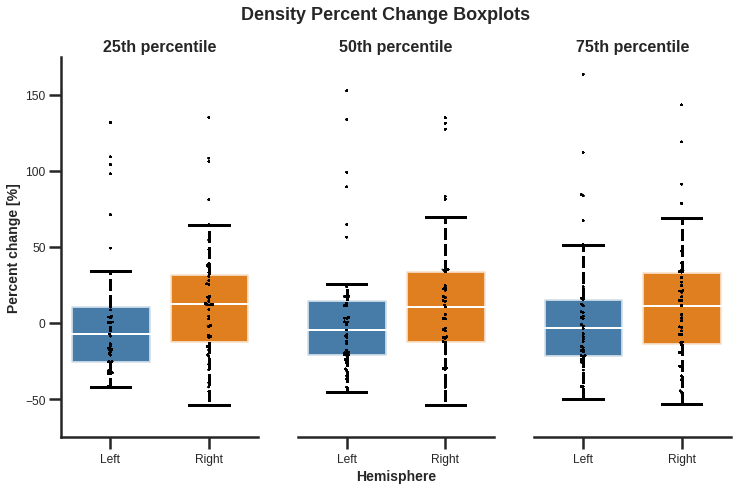

In [64]:
%matplotlib inline

fig, ax = plt.subplots(1, 3, figsize=(12, 7))

# Compute percent difference
for idx, subj in df_ansa.iterrows():
    for i, perc in enumerate([25, 50, 75]):
        diff = (
            np.divide(
                np.subtract(
                    df_ansa.loc[idx, f"Retest Density ({perc}th percentile)"],
                    df_ansa.loc[idx, f"Test Density ({perc}th percentile)"],
                ),
                df_ansa.loc[idx, f"Test Density ({perc}th percentile)"],
            )
            * 100
        )

        df_ansa.at[idx, f"Percent Change ({perc}th percentile)"] = diff

        # Plot hemispheric difference
        sns.boxplot(
            data=df_ansa,
            x="Hemi",
            y=f"Percent Change ({perc}th percentile)",
            dodge=True,
            ax=ax[i],
            boxprops=boxprops,
            whiskerprops=whiskerprops,
            capprops=capprops,
            medianprops=medianprops,
            showfliers=False,
            whis=0.95,
        )
        sns.swarmplot(
            data=df_ansa,
            x="Hemi",
            y=f"Percent Change ({perc}th percentile)",
            ax=ax[i],
            color="black",
            alpha=0.5,
            dodge=True,
            size=2,
        )

        # Plot parameters
        ax[i].set_ylim([-75, 175])
        ax[i].spines["right"].set_visible(False)
        ax[i].spines["top"].set_visible(False)
        ax[i].set_xticklabels(["Left", "Right"])
        ax[i].set_title(f"{perc}th percentile")

        if i == 0:
            ax[i].set_ylabel("Percent change [%]")
        else:
            ax[i].spines["left"].set_visible(False)
            ax[i].set_yticks([])
            ax[i].set_yticklabels("")
            ax[i].set_ylabel("")

        if i == 1:
            handles, _ = ax[i].get_legend_handles_labels()
            ax[i].set_xlabel("Hemisphere")
        else:
            ax[i].set_xlabel("")

    plt.suptitle("Density Percent Change Boxplots", fontsize=18, fontweight="bold")

filename = "{0}/ansa_hemi_percent_change.png".format(figure_dir)
# plt.savefig(filename, dpi=300, bbox_inches="tight", facecolor="white")

plt.show()
plt.close()

In [62]:
for idx, subj in tqdm(df_ansa.iterrows()):
    subj = subj
    hemi = df_ansa.loc[idx, "Hemi"]

    for percentile in [25, 50, 75]:
        df_ansa.at[idx, f"wDSC ({percentile}th percentile)"] = compute_dsc_ansa(
            subj, hemi, percentile, weighted=True
        )
        df_ansa.at[idx, f"DSC ({percentile}th percentile)"] = compute_dsc_ansa(
            subj, hemi, percentile, weighted=False
        )

86it [10:26,  7.29s/it]


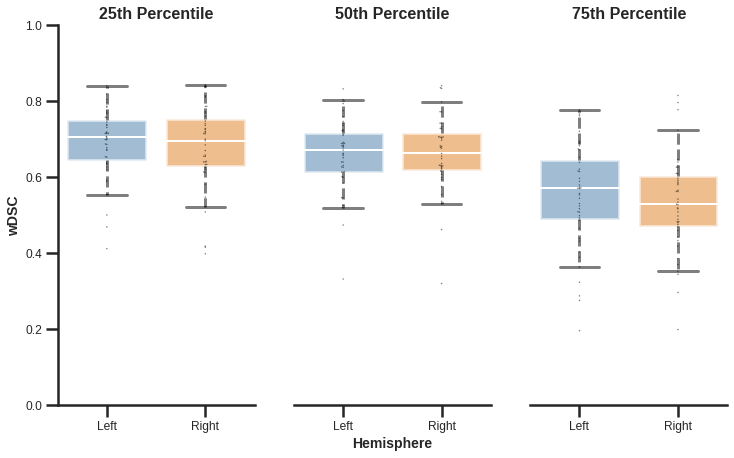

In [67]:
# Plot ansa dice scores
%matplotlib inline

fig, ax = plt.subplots(1, 3, figsize=(12, 7))

for i, perc in enumerate([25, 50, 75]):
    sns.boxplot(
        data=df_ansa,
        x="Hemi",
        y=f"wDSC ({perc}th percentile)",
        dodge=True,
        ax=ax[i],
        boxprops=boxprops,
        whiskerprops=whiskerprops,
        capprops=capprops,
        medianprops=medianprops,
        showfliers=False,
        whis=0.95,
    )
    sns.swarmplot(
        data=df_ansa,
        x="Hemi",
        y=f"wDSC ({perc}th percentile)",
        color="black",
        alpha=0.5,
        ax=ax[i],
        dodge=True,
        size=1.5,
    )

    # Labels
    ax[i].set_xticklabels(["Left", "Right"])
    ax[i].spines["right"].set_visible(False)
    ax[i].spines["top"].set_visible(False)
    ax[i].set_ylim([0, 1])
    ax[i].set_title(f"{perc}th Percentile")

    if i == 0:
        ax[i].set_ylabel("wDSC")
    else:
        ax[i].spines["left"].set_visible(False)
        ax[i].set_ylabel("")
        ax[i].set_yticklabels("")
        ax[i].set_yticks([])

    if i == 1:
        ax[i].set_xlabel("Hemisphere")
    else:
        ax[i].set_xlabel("")

filename = "{0}/ansa_hemi_wDSC.png".format(figure_dir)
# plt.savefig(filename, dpi=300, bbox_inches="tight", facecolor="white")

plt.show()
plt.close()

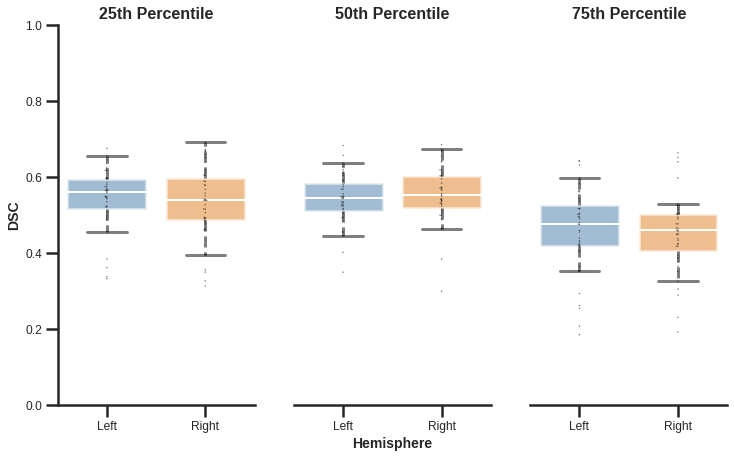

In [68]:
# Plot ansa dice scores
%matplotlib inline

fig, ax = plt.subplots(1, 3, figsize=(12, 7))

for i, perc in enumerate([25, 50, 75]):
    sns.boxplot(
        data=df_ansa,
        x="Hemi",
        y=f"DSC ({perc}th percentile)",
        dodge=True,
        ax=ax[i],
        boxprops=boxprops,
        whiskerprops=whiskerprops,
        capprops=capprops,
        medianprops=medianprops,
        showfliers=False,
        whis=0.95,
    )
    sns.swarmplot(
        data=df_ansa,
        x="Hemi",
        y=f"DSC ({perc}th percentile)",
        color="black",
        alpha=0.5,
        ax=ax[i],
        dodge=True,
        size=1.5,
    )

    # Labels
    ax[i].set_xticklabels(["Left", "Right"])
    ax[i].spines["right"].set_visible(False)
    ax[i].spines["top"].set_visible(False)
    ax[i].set_ylim([0, 1])
    ax[i].set_title(f"{perc}th Percentile")

    if i == 0:
        ax[i].set_ylabel("DSC")
    else:
        ax[i].set_ylabel("")
        ax[i].set_yticklabels("")
        ax[i].set_yticks([])
        ax[i].spines["left"].set_visible(False)

    if i == 1:
        ax[i].set_xlabel("Hemisphere")
    else:
        ax[i].set_xlabel("")

filename = "{0}/ansa_hemi_DSC.png".format(figure_dir)
# plt.savefig(filename, dpi=300, bbox_inches="tight", facecolor="white")

plt.show()
plt.close()

In [75]:
df_ansa.head(n=5)

,Subject,Hemi,Test Density (25th percentile),Retest Density (25th percentile),Test Density (50th percentile),Retest Density (50th percentile),Test Density (75th percentile),Retest Density (75th percentile),L Test Density,R Test Density,...,Test Density (75th percentile) [log10],Retest Density (75th percentile) [log10],Avg. Density (25th percentile),Avg. Density (25th percentile) [log10],wDSC (25th percentile),DSC (25th percentile),wDSC (50th percentile),DSC (50th percentile),wDSC (75th percentile),DSC (75th percentile)
0,sub-103818,L,25.811750,19.102537,17.603470,13.390472,8.778151,6.900409,NaN,NaN,...,0.943403,0.838875,22.457144,1.351355,0.839581,0.674966,0.831538,0.682782,0.765279,0.643290
1,sub-103818,R,24.609638,30.947968,16.440740,20.493039,8.282077,10.517838,NaN,NaN,...,0.918139,1.021926,NaN,NaN,0.839530,0.667486,0.834388,0.685233,0.776838,0.639959
2,sub-105923,L,11.895979,10.098956,8.051403,6.973854,4.061296,3.407783,NaN,NaN,...,0.608665,0.532472,NaN,NaN,0.652270,0.509294,0.639169,0.527157,0.552957,0.475007
3,sub-105923,R,13.316588,12.999744,8.885919,7.999728,4.706664,4.041292,NaN,NaN,...,0.672713,0.606520,NaN,NaN,0.633084,0.486914,0.681789,0.567868,0.541850,0.457762
4,sub-111312,L,7.493313,7.795275,5.112400,5.271824,2.566353,2.644066,NaN,NaN,...,0.409316,0.422272,NaN,NaN,0.653339,0.522167,0.625460,0.496678,0.507738,0.428902


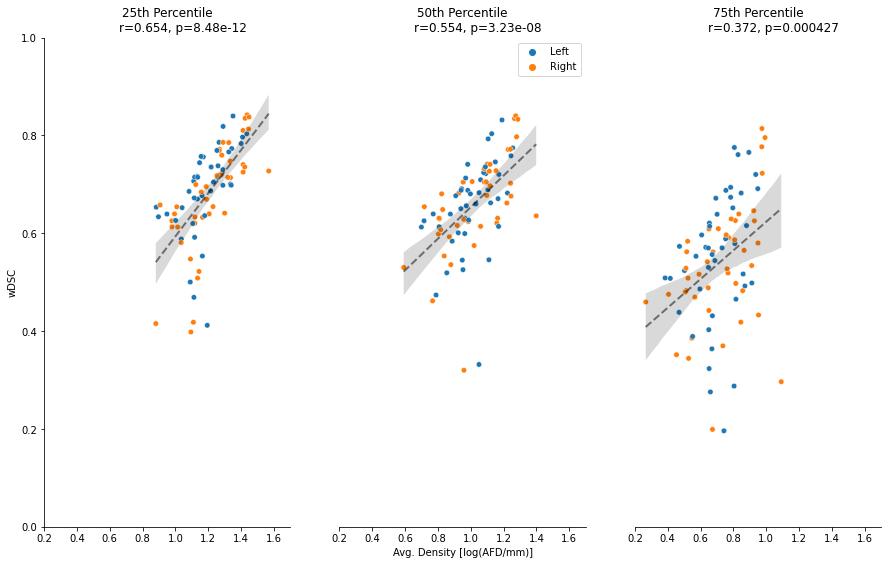

In [80]:
# Compute average density
%matplotlib inline
f, ax = plt.subplots(1, 3, figsize=(15, 9))

for idx, subj in df_ansa.iterrows():
    for i, perc in enumerate([25, 50, 75]):
        mean = np.mean(
            [
                df_ansa.loc[idx, f"Test Density ({perc}th percentile)"],
                df_ansa.loc[idx, f"Retest Density ({perc}th percentile)"],
            ]
        )
        df_ansa.at[idx, f"Avg. Density ({perc}th percentile)"] = mean
        df_ansa.at[idx, f"Avg. Density ({perc}th percentile) [log10]"] = np.log10(mean)

for i, perc in enumerate([25, 50, 75]):
    sns.scatterplot(
        data=df_ansa,
        x=f"Avg. Density ({perc}th percentile) [log10]",
        y=f"wDSC ({perc}th percentile)",
        hue="Hemi",
        ax=ax[i],
        s=30,
    )
    sns.regplot(
        data=df_ansa,
        x=f"Avg. Density ({perc}th percentile) [log10]",
        y=f"wDSC ({perc}th percentile)",
        ax=ax[i],
        scatter=False,
        color="k",
        ci=95,
        order=1,
        line_kws={"lw": 2, "linestyle": "--", "alpha": 0.5},
    )

    pstats = stats.pearsonr(
        df_ansa[f"Avg. Density ({perc}th percentile) [log10]"],
        df_ansa[f"wDSC ({perc}th percentile)"],
    )

    # Plot parameters
    ax[i].set_ylim([0, 1])
    ax[i].set_xlim([0.2, 1.7])
    ax[i].spines["right"].set_visible(False)
    ax[i].spines["top"].set_visible(False)
    ax[i].set_title(
        f"""{perc}th Percentile
        r={pstats[0]:.3f}, p={pstats[1]:.3g}"""
    )

    if i == 0:
        ax[i].set_ylabel("wDSC")
    else:
        ax[i].spines["left"].set_visible(False)
        ax[i].set_yticks([])
        ax[i].set_yticklabels("")
        ax[i].set_ylabel("")

    if i == 1:
        handles, _ = ax[i].get_legend_handles_labels()
        ax[i].legend(handles[:2], ["Left", "Right"])
        ax[i].set_xlabel("Avg. Density [log(AFD/mm)]")
    else:
        ax[i].get_legend().remove()
        ax[i].set_xlabel("")

filename = "{0}/overlap_density_scatter.png".format(figure_dir)
# plt.savefig(filename, dpi=300, bbox_inches="tight", facecolor="white")

plt.show()
plt.close()

In [201]:
handle_session(save=True)

Saving notebook session


## Installed Packages <a class="anchor" id="installed_pkgs"></a>

In [41]:
import types

import pkg_resources


def get_imports():
    for name, val in globals().items():
        if isinstance(val, types.ModuleType):
            # Split ensures you get root package,
            # not just imported function
            name = val.__name__.split(".")[0]

        elif isinstance(val, type):
            name = val.__module__.split(".")[0]

        # Some packages have different
        # imported names vs. system/pip names. Unfortunately,
        # there is no systematic way to get pip names from
        # a package's imported name. You'll have to add
        # exceptions to this list manually!
        poorly_named_packages = {"PIL": "Pillow", "sklearn": "scikit-learn"}
        if name in poorly_named_packages.keys():
            name = poorly_named_packages[name]

        yield name


imports = list(set(get_imports()))

# Cross-check the names of installed packages vs. imported packages
requirements = []
for m in pkg_resources.working_set:
    if m.project_name in imports and m.project_name != "pip":
        requirements.append((m.project_name, m.version))

print("Packages used:")
for r in requirements[::-1]:
    print("{}=={}".format(*r))

Packages used:
dill==0.3.4
dipy==1.4.1
fury==0.6.1
joblib==0.11
matplotlib==3.3.4
nibabel==3.2.1
numpy==1.19.5
pandas==1.0.5
pingouin==0.3.12
scipy==1.4.1
seaborn==0.11.2
tqdm==4.56.2
